# Exploratory Data Analysis (EDA) Notebook

## Description:

This notebook covers Exploratory Data Analysis (EDA) techniques, a crucial step in the data analysis process. EDA helps us better understand the dataset, identify patterns, trends, anomalies, and important insights. By exploring data visually and statistically, we can formulate hypotheses, validate assumptions, and prepare the data for modeling.

In this notebook, we'll explore various EDA techniques, including data visualization, descriptive statistics, handling missing values, outlier detection, and correlation analysis. Through these techniques, we can gain a deeper understanding of the data and extract valuable insights that can guide future decisions and actions.

**Author:** [Caique Matos]
**Date:** [04/15/24]


In [1]:
import pandas as pd
import numpy as np
import copy as cp
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import LabelEncoder
import math
import spacy

from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.probability import FreqDist
from wordcloud import WordCloud
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.probability import FreqDist
from nltk.stem import PorterStemmer
from wordcloud import WordCloud

from sklearn.metrics import jaccard_score
import itertools

import re

import scipy.stats as ss
from scipy.stats import kruskal

from sklearn.preprocessing import OrdinalEncoder

In [2]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from gensim import corpora

In [3]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('vader_lexicon')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\caiqu\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\caiqu\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\caiqu\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [4]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.set_option('display.max_columns', None)


In [5]:
path = 'C:/Users/caiqu/OneDrive/Competitions/sony/input/dataset/'

In [6]:
df = pd.read_excel(path+"train_set.xlsx")

In [7]:
# df.dtypes

**Exploratory Data Analysis (EDA) Roadmap**

1. **Overview and Data Quality Check:**
   - **Description:** Load the dataset and perform an initial examination to understand its structure, column types, and check for any missing or erroneous data.
   - **Importance:** This step provides a foundation for further analysis, ensuring data integrity and identifying potential issues that need to be addressed.


2. **Exploration of Genres:**
   - **Description:** Investigate the distribution of genres in the dataset and explore how they relate to other variables such as ratings, budget, number of votes, and runtime.
   - **Sub-steps:**
     - **Budget Analysis by Genre:** Analyze the relationship between genres and budget, exploring the average budget for each genre and examining how budget allocation varies.
     - **Analysis of Ratings by Genre:** Understand the relationship between genres and movie ratings.
     - **Genres by Number of Votes:** Explore the popularity of genres based on the number of votes.
     - **Analysis of Runtime by Genre:** Examine how movie runtimes vary across different genres.
     - **tittle Type Analysis:** Examine how diferent tipes of movies vary across different genres.
     
   - **Importance:** Understanding the distribution of genres and their relationships with other variables provides insights into audience preferences and content characteristics, guiding decisions related to content production, marketing, and audience engagement. Also, showing possible patterns betweens movies features and their genre.


3. **Temporal Analysis:**
   - **Description:** Explore trends over time, such as release dates, and analyze how variables like ratings, budget, and popularity have evolved. Also, its is important to explore if the rate over time could be important to define the genre of a movie.
   - **Importance:** Temporal analysis provides insights about how to use time to understand the genre definition by time. Besides, research about changes in audience preferences, market trends, and industry dynamics, guiding future strategies and decision-making.


4. **Text Data Analysis:**
    - **Description:** If applicable, analyze textual data such as plot summaries or titles using natural language processing techniques to extract insights or identify genre patterns.
    - **Importance:** Text data analysis provides additional context and enriches the understanding of content characteristics, themes, and audience sentiment.


5. **Correlation Analysis:**
    - **Description:** If applicable, analyze textual data such as plot summaries or titles using natural language processing techniques to extract insights or identify genre patterns.
    - **Importance:** Text data analysis provides additional context and enriches the understanding of content characteristics, themes, and audience sentiment.
    
6. **Results:**


By following this EDA roadmap, you can thoroughly explore various aspects of your dataset and gain valuable insights to inform decision-making and strategy development.


# EDA

## 1. Overview and Data Quality Check: Pandas Profilling 

Checking quality of the dataset by columns.

Number of missing values, max, min and mean. Also, checking correlations but this topic will be more explorated after this first analisys.

In [8]:
profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True)

In [9]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Dataframe Size and Primary Key:
- The dataframe consists of 12,000 rows with unique IDs for each row, totaling 12,000 unique IDs.
- Few movies have repeated names.

#### Trend Analysis:
- Looking at the dates, we can identify a possible trend of growth in the number of films over time.

#### Duration Statistics:
- We observe the statistical values of the duration of the films and find that 6.5% of values are missing.

#### Plot Columns Exploration:
- Notably, there is a considerable amount of missing data in the outline plot and medium plot columns, approximately 31% and 36% respectively. However, this is not the case for summary plots.
- The high percentage of missing values in the outline and medium plots may indicate potential difficulties in exploring and collecting important information for a possible genre predictor.

#### Rating Analysis:
- There are no missing values in the ratings column.
- We identify the distribution of ratings with a large number of values between 4 and 6 and an average of 6.26. This may be interesting if we find some kind of relationship with the genres.

#### Number of Votes and Budget:
- A possible high correlation between the number of votes and the budget is observed. This suggests a relationship where movies with higher or lower production and distribution costs have more or fewer consumers and therefore higher or lower popularity.
- However, the budget column suffers from many missing values, so we need to be cautious about a possible correlation phenomenon caused by the null values.

#### Genre Column Analysis:
- No missing values are observed in the genre column, which will be our target.
- However, examining the distribution of values, we notice a class imbalance issue. There are many movies of the same genre and few of others, which could pose a problem for an automatic genre predictor.


## 2. Exploring the genres

### Quantity of movies by Genre

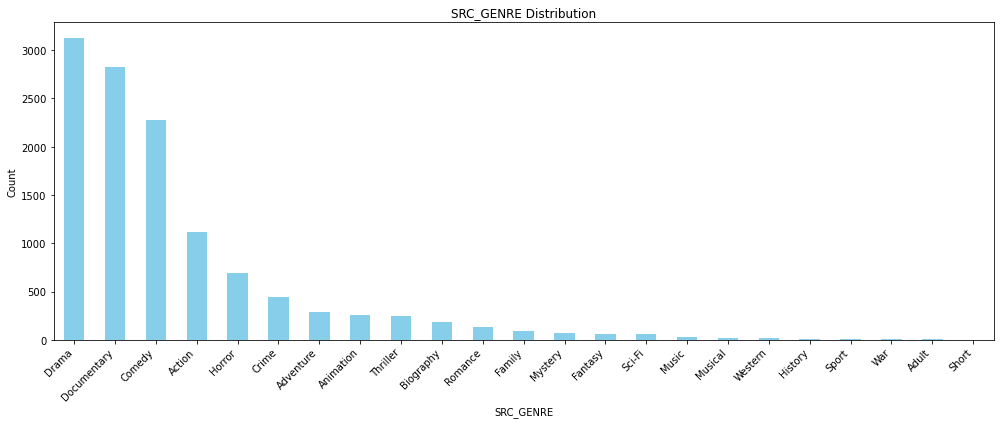

In [10]:
genre_counts = df['SRC_GENRE'].value_counts()

plt.figure(figsize=(14, 6))
genre_counts.plot(kind='bar', color='skyblue')
plt.title('SRC_GENRE Distribution')
plt.xlabel('SRC_GENRE')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

The plot of film counts by genre reveals an issue of imbalanced classes, where some genres have significantly more films than others. This can lead to bias in training a genre predictor model, as the model may struggle to learn representative patterns of less frequent genres, resulting in lower accuracy in classifying those genres.

### Budget Analysis by Genre

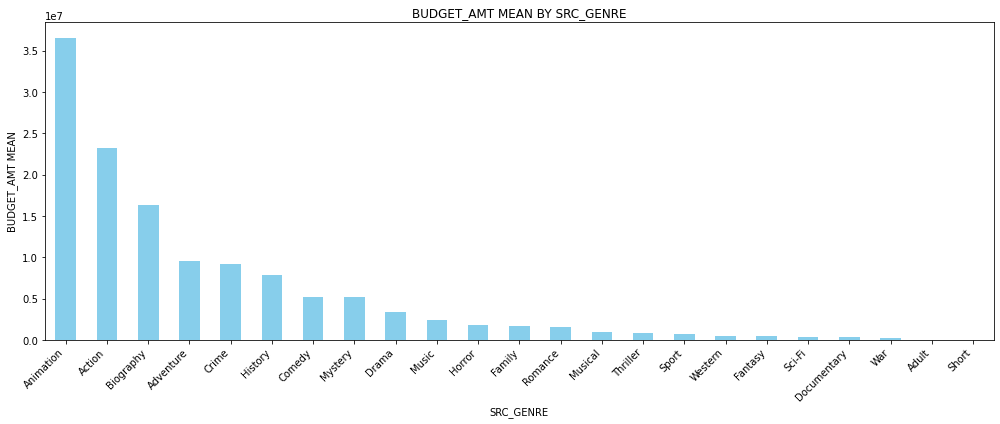

In [11]:
mean_budget_by_genre = df.groupby('SRC_GENRE')['BUDGET_AMT'].mean().sort_values(ascending=False)

plt.figure(figsize=(14, 6))
mean_budget_by_genre.plot(kind='bar', color='skyblue')
plt.title('BUDGET_AMT MEAN BY SRC_GENRE')
plt.xlabel('SRC_GENRE')
plt.ylabel('BUDGET_AMT MEAN')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

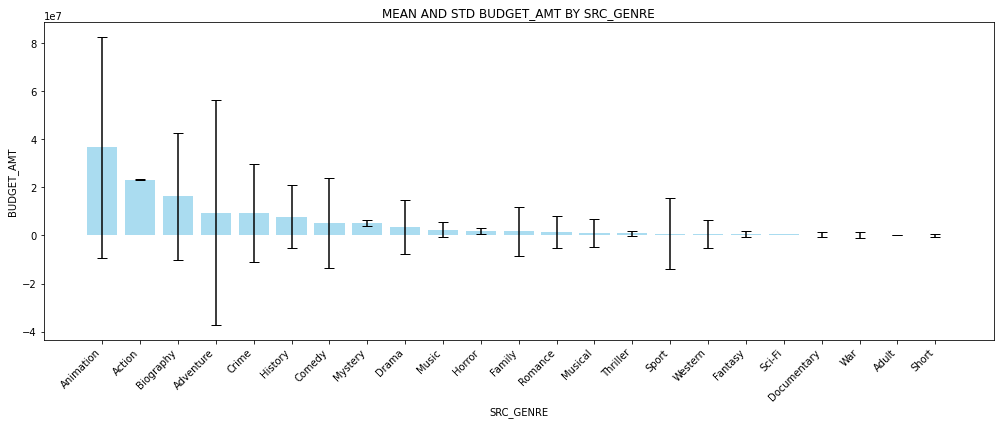

In [12]:
mean_budget_by_genre = df.groupby('SRC_GENRE')['BUDGET_AMT'].mean().sort_values(ascending=False)
std_budget_by_genre = df.groupby('SRC_GENRE')['BUDGET_AMT'].std()


plt.figure(figsize=(14, 6))
plt.bar(mean_budget_by_genre.index, mean_budget_by_genre, yerr=std_budget_by_genre, color='skyblue', alpha=0.7, capsize=5)
plt.title('MEAN AND STD BUDGET_AMT BY SRC_GENRE')
plt.xlabel('SRC_GENRE')
plt.ylabel('BUDGET_AMT')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

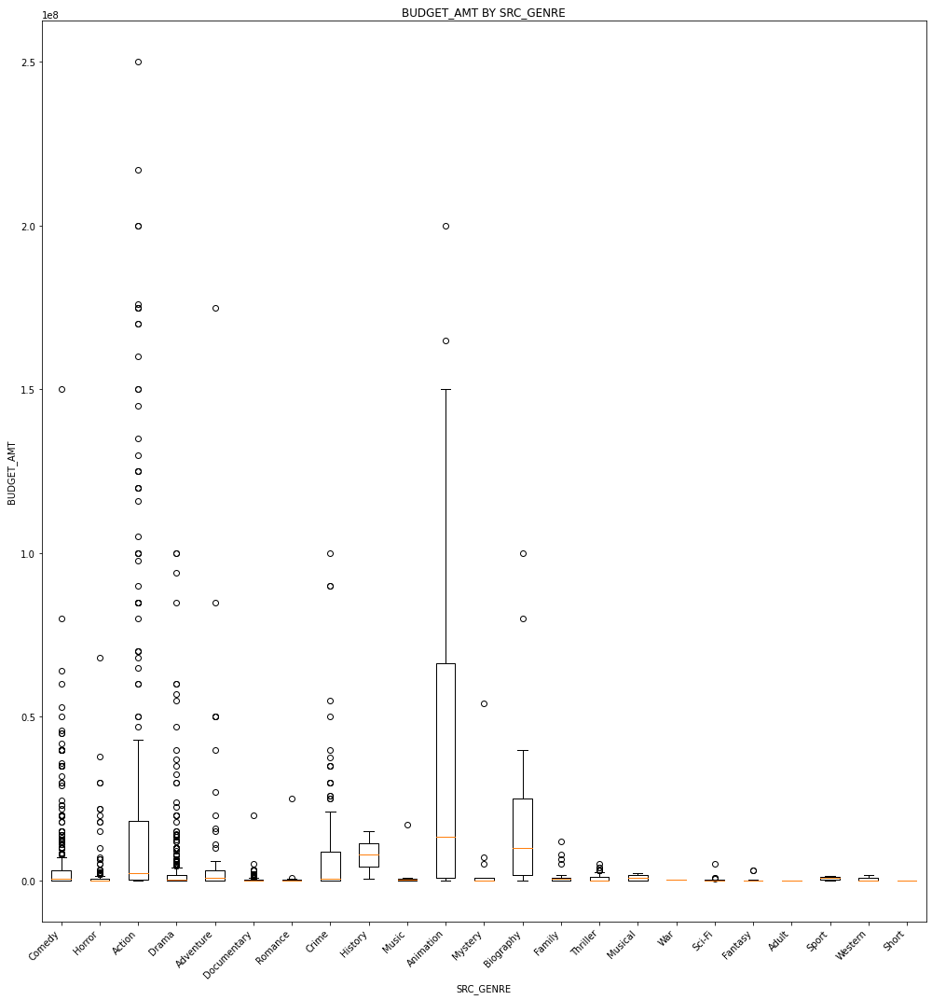

In [13]:
plt.figure(figsize=(14, 15))
plt.boxplot([df[df['SRC_GENRE'] == genre]['BUDGET_AMT'].dropna() for genre in df['SRC_GENRE'].unique()],
            labels=df['SRC_GENRE'].unique())
plt.title('BUDGET_AMT BY SRC_GENRE')
plt.xlabel('SRC_GENRE')
plt.ylabel('BUDGET_AMT')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Analysis of Ratings by Genre

<Figure size 1440x432 with 0 Axes>

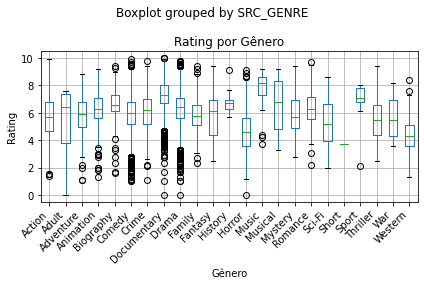

In [14]:
plt.figure(figsize=(20, 6))

df.boxplot(column='RATING_AVG', by='SRC_GENRE', rot=45)
plt.title('Rating por Gênero')
plt.xlabel('Gênero')
plt.ylabel('Rating')
plt.xticks(ha='right')
plt.tight_layout()
plt.show()

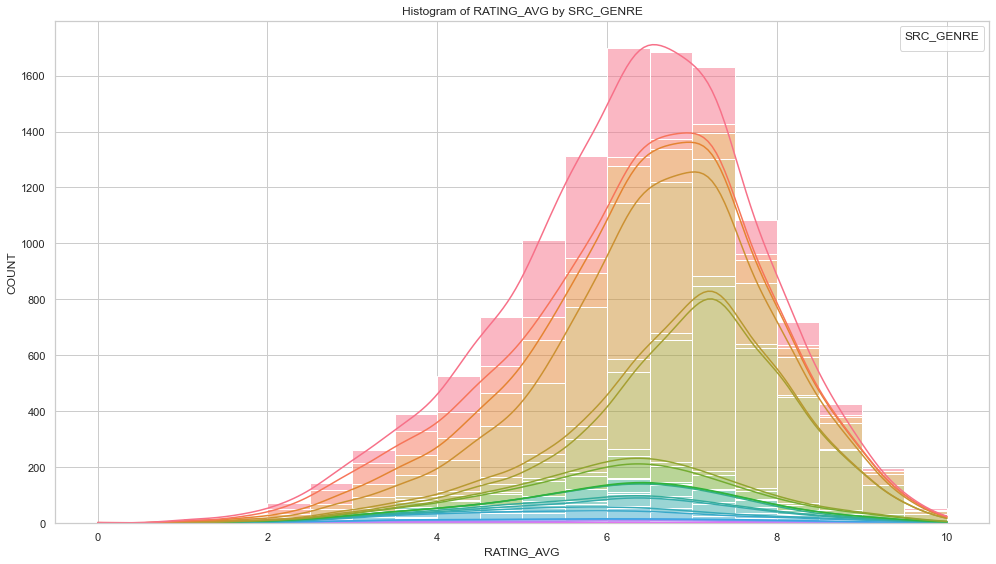

In [15]:
sns.set(style="whitegrid")

# Create the histogram
plt.figure(figsize=(14, 8))
ax = sns.histplot(data=df, x='RATING_AVG', hue='SRC_GENRE', kde=True, bins=20, palette='husl', multiple='stack')

# Set the title and axis labels
plt.title('Histogram of RATING_AVG by SRC_GENRE')
plt.xlabel('RATING_AVG')
plt.ylabel('COUNT')

# Add legend with genre labels
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles, labels, title='SRC_GENRE', loc='upper right')

plt.tight_layout()
plt.show()

In [16]:
# Create the histogram with Plotly
fig = px.histogram(df, x='RATING_AVG', color='SRC_GENRE', marginal='box', nbins=20,
                   title='Histogram of RATING_AVG by SRC_GENRE', 
                   labels={'RATING_AVG': 'RATING_AVG', 'count': 'COUNT', 'SRC_GENRE': 'SRC_GENRE'})
fig.update_layout(bargap=0.2)
fig.show()


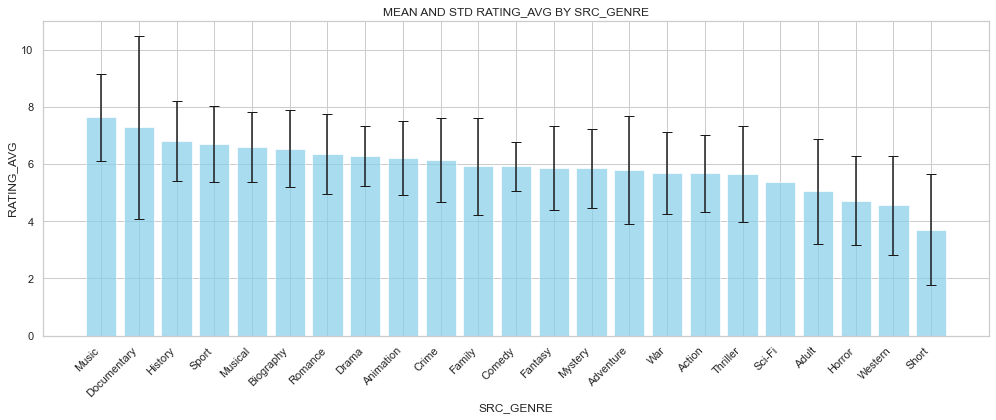

In [17]:
mean_rating_by_genre = df.groupby('SRC_GENRE')['RATING_AVG'].mean().sort_values(ascending=False)
std_rating_by_genre = df.groupby('SRC_GENRE')['RATING_AVG'].std()


plt.figure(figsize=(14, 6))
plt.bar(mean_rating_by_genre.index, mean_rating_by_genre, yerr=std_rating_by_genre, color='skyblue', alpha=0.7, capsize=5)
plt.title('MEAN AND STD RATING_AVG BY SRC_GENRE')
plt.xlabel('SRC_GENRE')
plt.ylabel('RATING_AVG')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Genres by Number of Votes

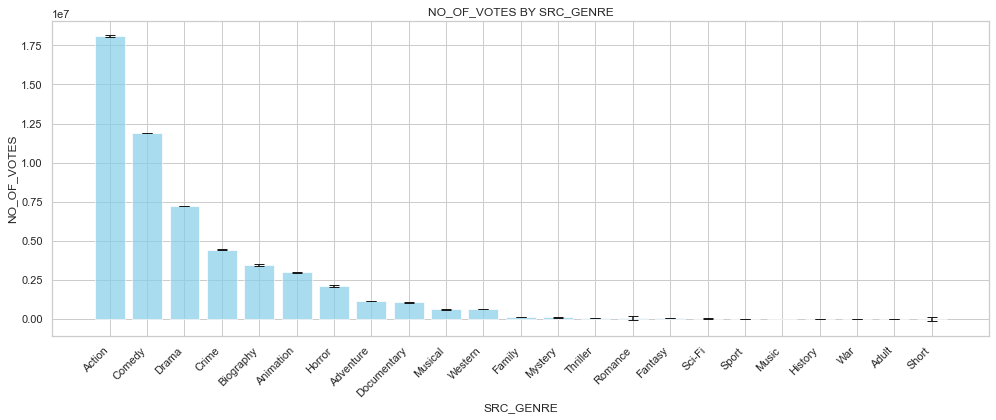

In [18]:
total_votes_by_genre = df.groupby('SRC_GENRE')['NO_OF_VOTES'].sum().sort_values(ascending=False)
std_votes_by_genre = df.groupby('SRC_GENRE')['NO_OF_VOTES'].std()

plt.figure(figsize=(14, 6))
plt.bar(total_votes_by_genre.index, total_votes_by_genre, yerr=std_votes_by_genre, color='skyblue', alpha=0.7, capsize=5)
plt.title('NO_OF_VOTES BY SRC_GENRE')
plt.xlabel('SRC_GENRE')
plt.ylabel('NO_OF_VOTES')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Analysis of Runtime by Genre

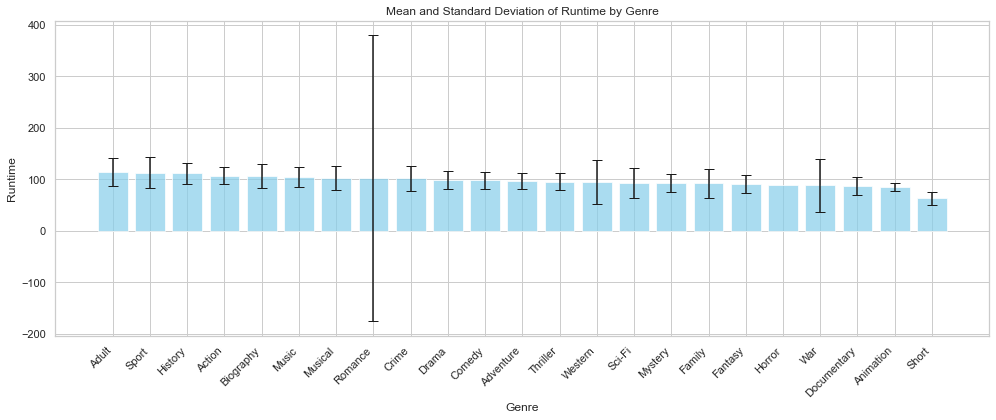

In [19]:
# Calculate the mean and standard deviation of runtime by genre
mean_runtime_by_genre = df.groupby('SRC_GENRE')['RUN_TIME'].mean().sort_values(ascending=False)
std_runtime_by_genre = df.groupby('SRC_GENRE')['RUN_TIME'].std()

# Plot the bar chart of mean runtime with error bars representing the standard deviation
plt.figure(figsize=(14, 6))
plt.bar(mean_runtime_by_genre.index, mean_runtime_by_genre, yerr=std_runtime_by_genre, color='skyblue', alpha=0.7, capsize=5)
plt.title('Mean and Standard Deviation of Runtime by Genre')
plt.xlabel('Genre')
plt.ylabel('Runtime')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Tittle Type

All records are of the movie type, so this column can be considered insignificant for analysis.

In [20]:
df['TITLE_TYPE'].value_counts()

movie    12000
Name: TITLE_TYPE, dtype: int64

## 3. Temporal Analysis

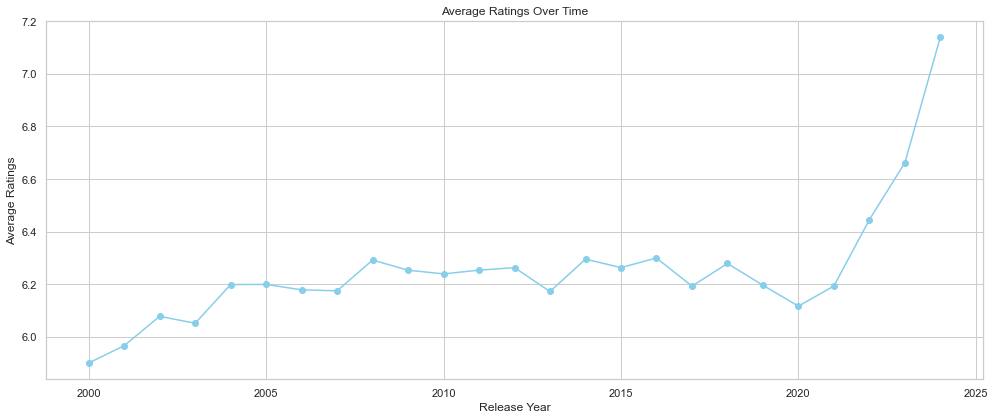

In [21]:
# Convert the date column to datetime type
df['RELEASE_DT'] = pd.to_datetime(df['RELEASE_DT'])

# Calculate the mean ratings by year
mean_rating_by_year = df.groupby(df['RELEASE_DT'].dt.year)['RATING_AVG'].mean()

# Plot the line chart of mean ratings over time
plt.figure(figsize=(14, 6))
mean_rating_by_year.plot(marker='o', color='skyblue')
plt.title('Average Ratings Over Time')
plt.xlabel('Release Year')
plt.ylabel('Average Ratings')
plt.grid(True)
plt.tight_layout()
plt.show()

Observing this grah we can identify a possible growing trend of rates by year. It can sugegst that the films could be being better produced or they are more popular them before. The covid could be related to this.

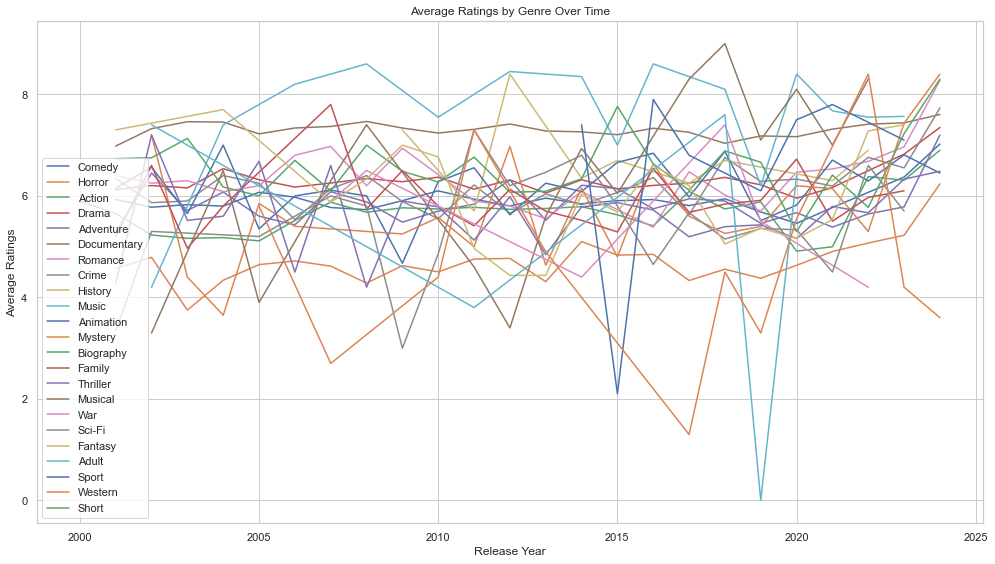

In [22]:
# Calculate the average ratings by genre and by year
mean_rating_by_genre_year = df.groupby(['SRC_GENRE', df['RELEASE_DT'].dt.year])['RATING_AVG'].mean()

# Plot the line charts of average ratings over time for each genre
plt.figure(figsize=(14, 8))

for genre in df['SRC_GENRE'].unique():
    genre_data = mean_rating_by_genre_year[genre].reset_index()
    plt.plot(genre_data['RELEASE_DT'], genre_data['RATING_AVG'], label=genre)

plt.title('Average Ratings by Genre Over Time')
plt.xlabel('Release Year')
plt.ylabel('Average Ratings')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

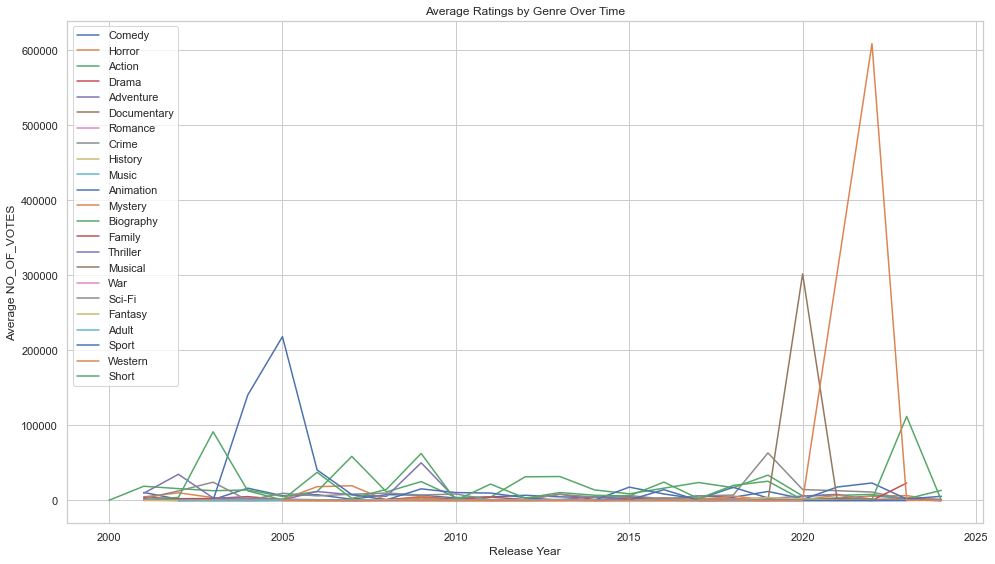

In [23]:
# Calculate the average ratings by genre and by year
mean_rating_by_genre_year = df.groupby(['SRC_GENRE', df['RELEASE_DT'].dt.year])['NO_OF_VOTES'].mean()

# Plot the line charts of average ratings over time for each genre
plt.figure(figsize=(14, 8))

for genre in df['SRC_GENRE'].unique():
    genre_data = mean_rating_by_genre_year[genre].reset_index()
    plt.plot(genre_data['RELEASE_DT'], genre_data['NO_OF_VOTES'], label=genre)

plt.title('Average Ratings by Genre Over Time')
plt.xlabel('Release Year')
plt.ylabel('Average NO_OF_VOTES')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

However when we plot the ratings avg per time by Genre we can see that we dont have clear growing trend per Genre.

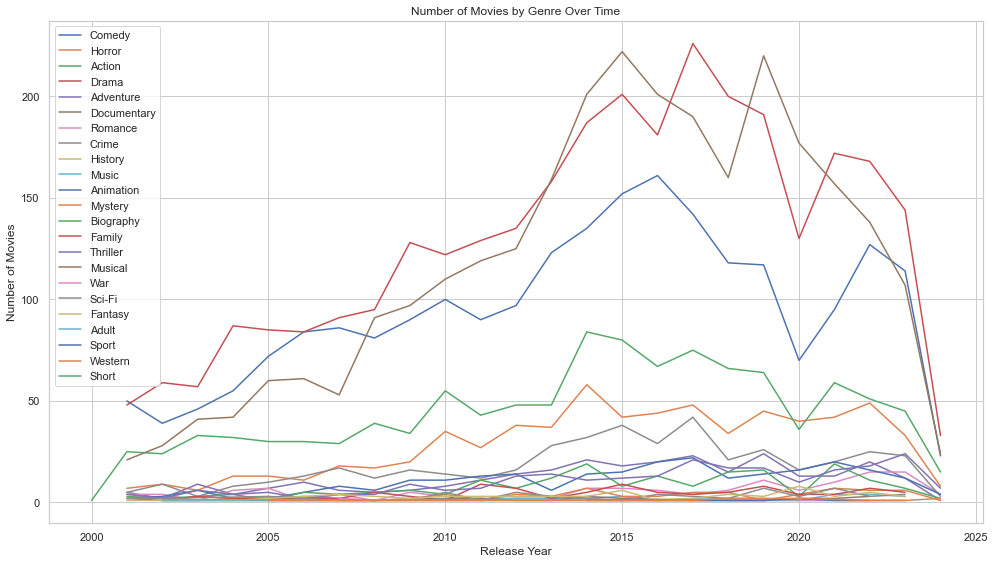

In [24]:
# Calculate the number of movies by genre and by year
count_movies_by_genre_year = df.groupby(['SRC_GENRE', df['RELEASE_DT'].dt.year]).size()

# Plot the line charts of movie counts over time for each genre
plt.figure(figsize=(14, 8))

for genre in df['SRC_GENRE'].unique():
    genre_data = count_movies_by_genre_year[genre].reset_index()
    plt.plot(genre_data['RELEASE_DT'], genre_data[0], label=genre)

plt.title('Number of Movies by Genre Over Time')
plt.xlabel('Release Year')
plt.ylabel('Number of Movies')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [25]:
df.columns

Index(['ID', 'SRC_TITLE_ID', 'SRC_TITLE_NM', 'TITLE_TYPE', 'TITLE_YR',
       'RELEASE_DT', 'RUN_TIME', 'PLOT_OUTLINE', 'PLOT_MEDIUM', 'PLOT_SUMMARY',
       'RATING_AVG', 'NO_OF_VOTES', 'BUDGET_AMT', 'SRC_GENRE'],
      dtype='object')

Looking at the number of films over time and by genre, we can once again see the difference in quantity and films between genres.

## 4. Text Data Analysis

Text data analysis provides additional context and enriches the understanding of content characteristics, themes, and audience sentiment. All of this features can be related to the Genre and can be a powerfull tool for modelling.

### Most commom terms

Examining the most common terms is essential in EDA for a movie genre predictor model. It helps identify key themes across genres, aiding in the accurate classification of films into their respective genres.

**Due to quality of the features we need to handle the missing values at PLOTS COLUMNS**

In [26]:
def calculate_word_frequencies(text_column):
    # Replace NaN values with an empty string
    text_column = text_column.fillna('')
    
    # Text preprocessing (removing stopwords, punctuation, etc.) and tokenization
    vectorizer = CountVectorizer(stop_words='english')
    X = vectorizer.fit_transform(text_column.astype(str))  # Convertendo para string
    
    # Calculate the word frequencies
    word_frequencies = X.sum(axis=0)

    # Get the most common terms
    terms = vectorizer.get_feature_names_out()
    word_freq_df = pd.DataFrame({'Term': terms, 'Frequency': word_frequencies.flat})
    word_freq_df = word_freq_df.sort_values(by='Frequency', ascending=False)
    
    return word_freq_df

def plot_top_terms(word_freq_df, title):
    # Plot the top 20 most common terms
    plt.figure(figsize=(14, 6))
    plt.bar(word_freq_df['Term'][:20], word_freq_df['Frequency'][:20])
    plt.title(title)
    plt.xlabel('Term')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

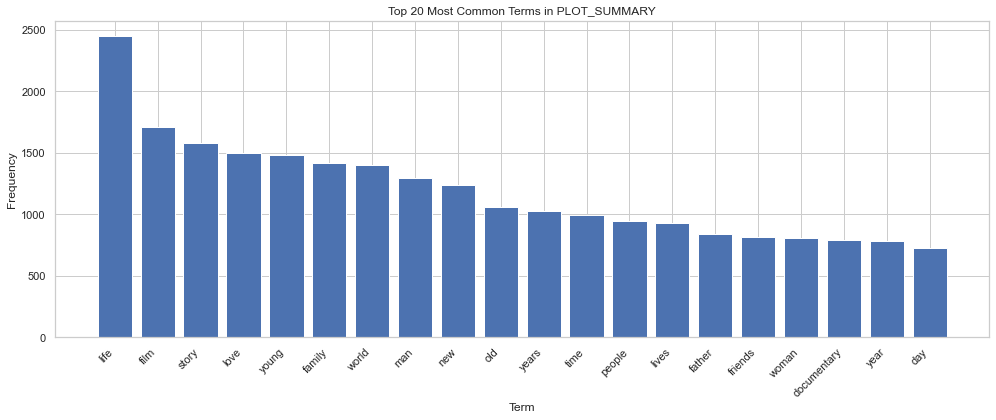

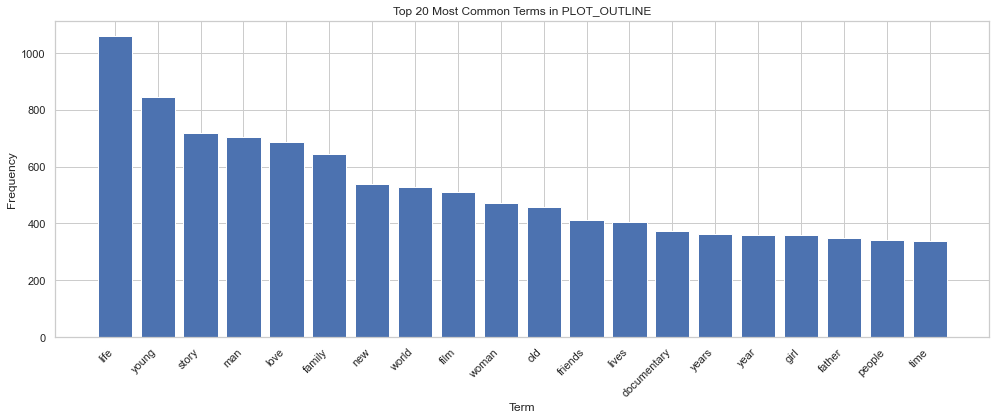

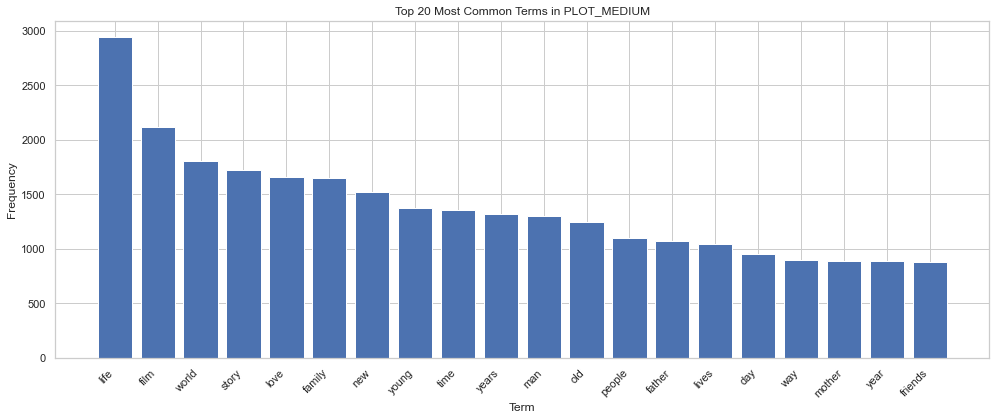

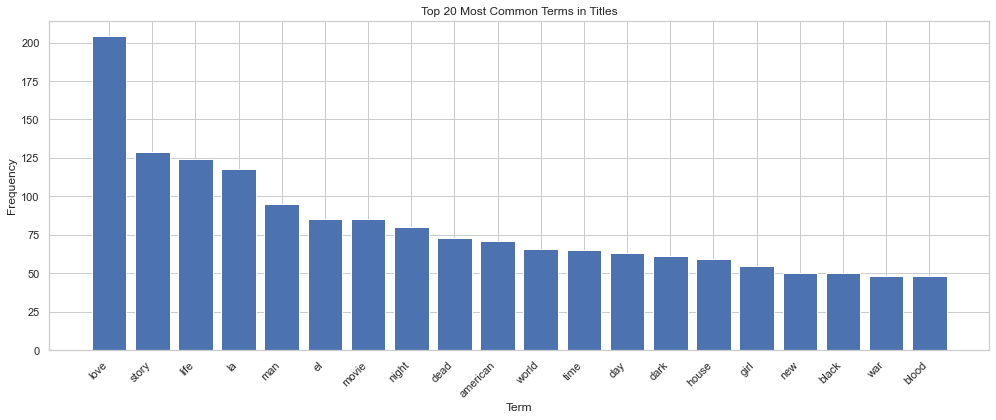

In [27]:
# Calculate word frequencies and plot top terms for PLOT_SUMMARY
word_freq_df_summary = calculate_word_frequencies(df['PLOT_SUMMARY'])
plot_top_terms(word_freq_df_summary, 'Top 20 Most Common Terms in PLOT_SUMMARY')

# Calculate word frequencies and plot top terms for PLOT_OUTLINE
word_freq_df_title = calculate_word_frequencies(df['PLOT_OUTLINE'])
plot_top_terms(word_freq_df_title, 'Top 20 Most Common Terms in PLOT_OUTLINE')

# Calculate word frequencies and plot top terms for PLOT_MEDIUM
word_freq_df_title = calculate_word_frequencies(df['PLOT_MEDIUM'])
plot_top_terms(word_freq_df_title, 'Top 20 Most Common Terms in PLOT_MEDIUM')

# Calculate word frequencies and plot top terms for titles
word_freq_df_title = calculate_word_frequencies(df['SRC_TITLE_NM'])
plot_top_terms(word_freq_df_title, 'Top 20 Most Common Terms in Titles')

In [28]:
def calculate_word_frequencies_by_genre(df_genre, column_name):
    # Replace NaN values with an empty string
    text_column = df_genre[column_name].fillna('')
    
    # Text preprocessing (removing stopwords, punctuation, etc.) and tokenization
    vectorizer = CountVectorizer(stop_words='english')
    X = vectorizer.fit_transform(text_column.astype(str))  # Convertendo para string
    
    # Calculate the word frequencies
    word_frequencies = X.sum(axis=0)

    # Get the most common terms
    terms = vectorizer.get_feature_names_out()
    word_freq_df = pd.DataFrame({'Term': terms, 'Frequency': word_frequencies.flat})
    word_freq_df = word_freq_df.sort_values(by='Frequency', ascending=False)
    
    return word_freq_df

def plot_top_terms_by_genre(df, genre, column_name, title):
    # Filter DataFrame by genre
    df_genre = df[df['SRC_GENRE'] == genre]
    
    # Calculate word frequencies for the specific genre
    word_freq_df = calculate_word_frequencies_by_genre(df_genre, column_name)
    
    # Plot the top 20 most common terms
    plt.figure(figsize=(14, 6))
    plt.bar(word_freq_df['Term'][:20], word_freq_df['Frequency'][:20])
    plt.title(title)
    plt.xlabel('Term')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

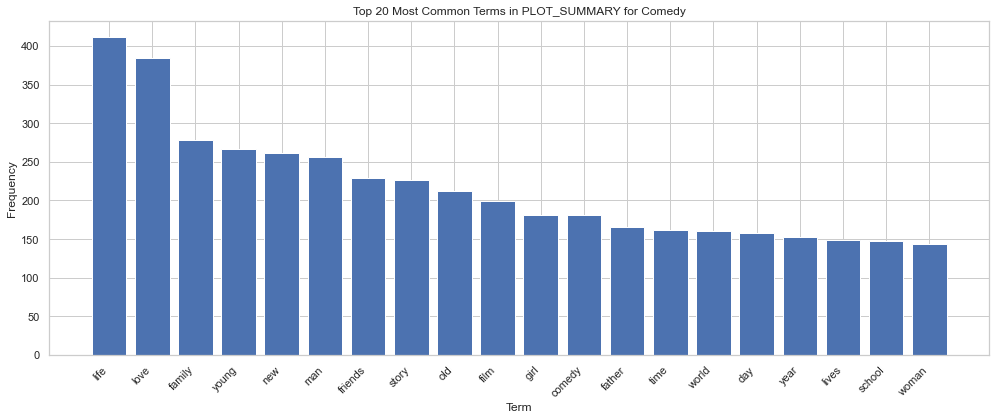

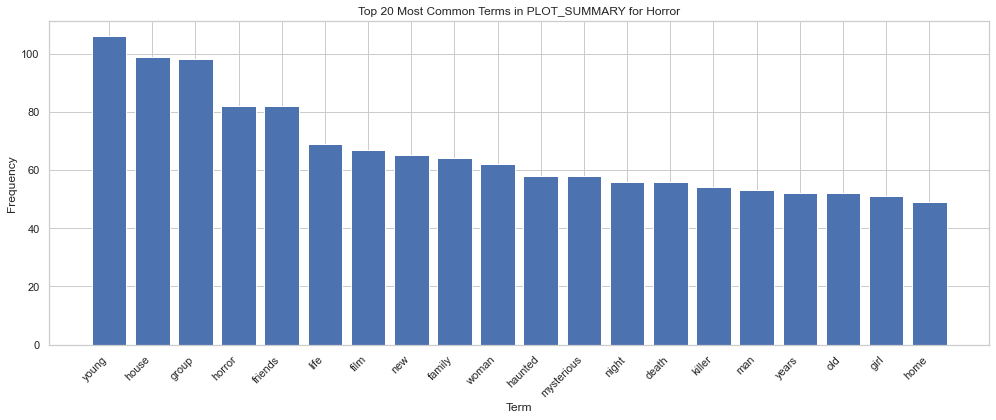

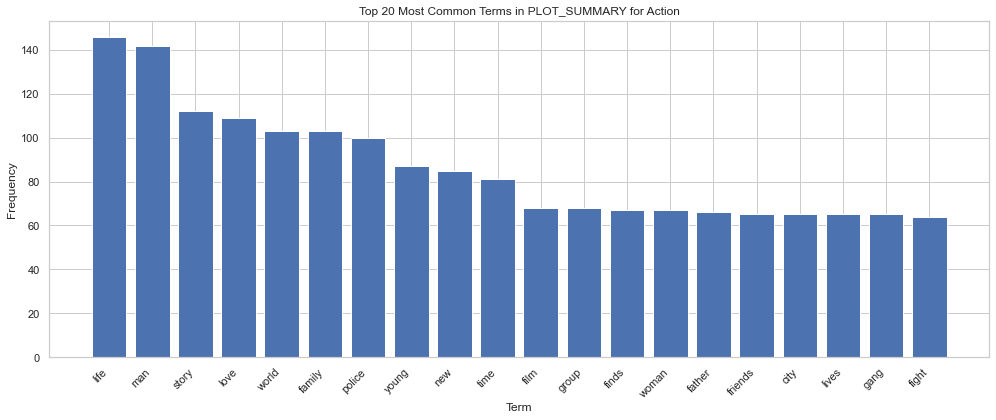

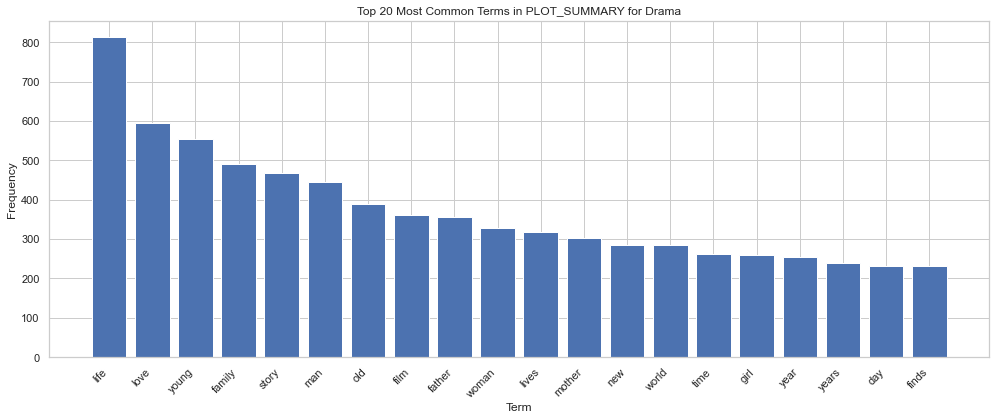

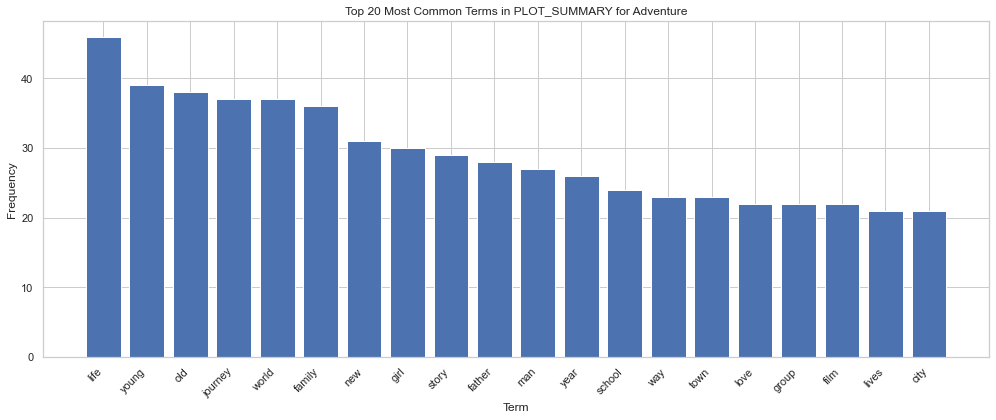

...

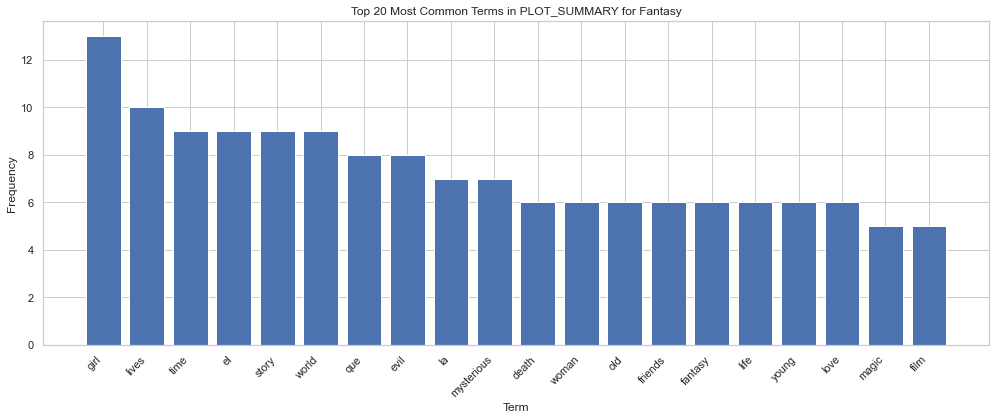

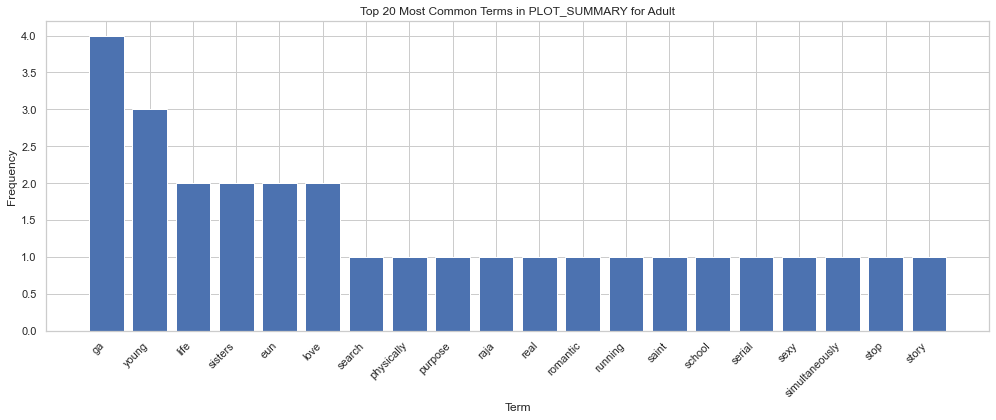

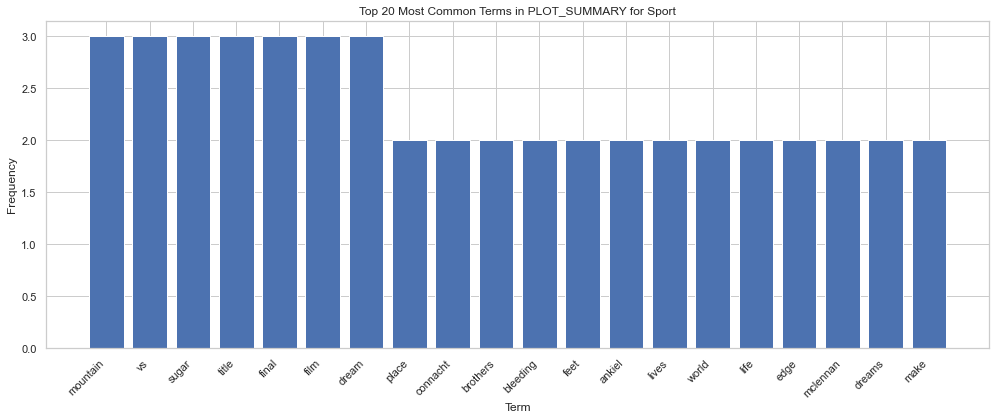

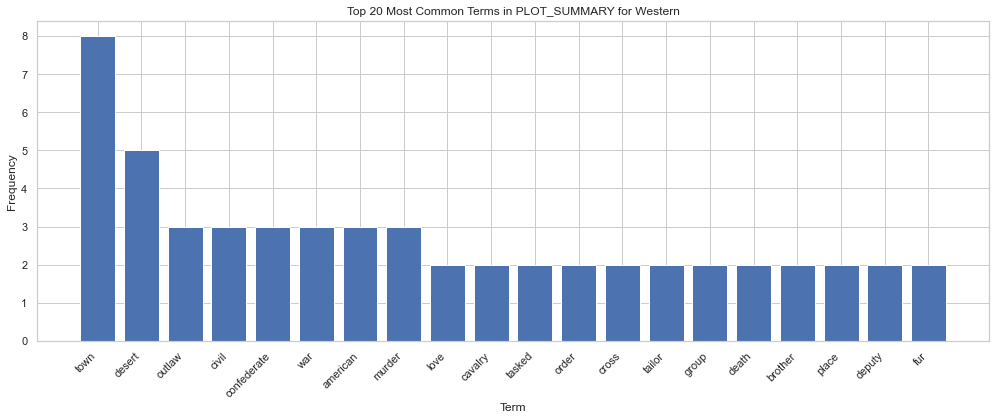

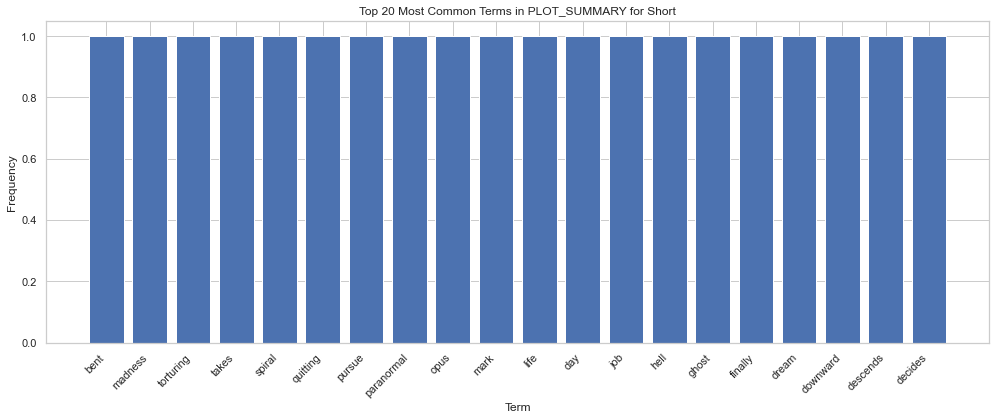

In [29]:
# Plot top terms for plot PLOT_SUMMARY by genre
for genre in df['SRC_GENRE'].unique():
    plot_top_terms_by_genre(df, genre, 'PLOT_SUMMARY', f'Top 20 Most Common Terms in PLOT_SUMMARY for {genre}')

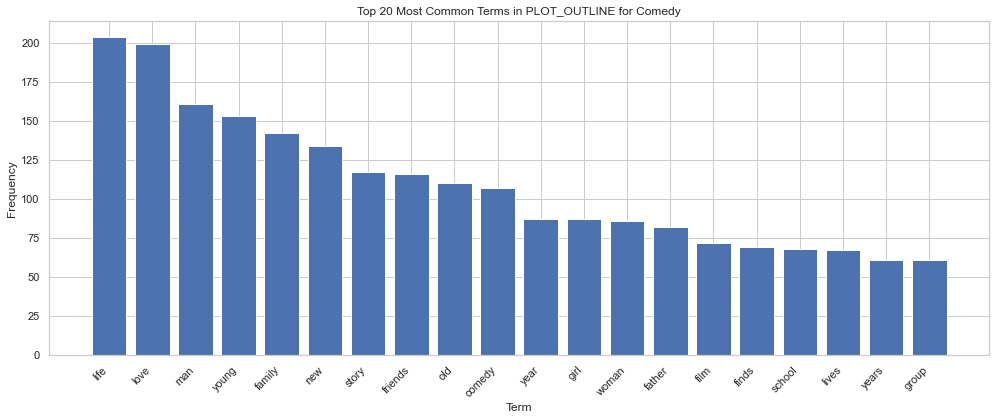

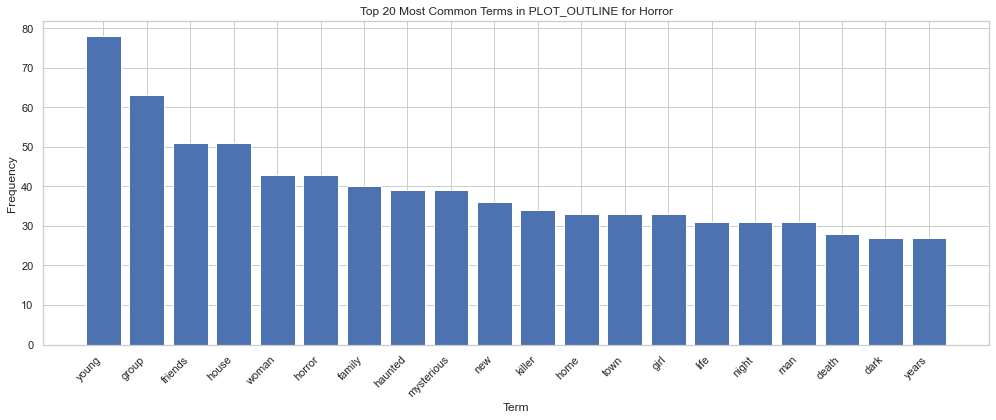

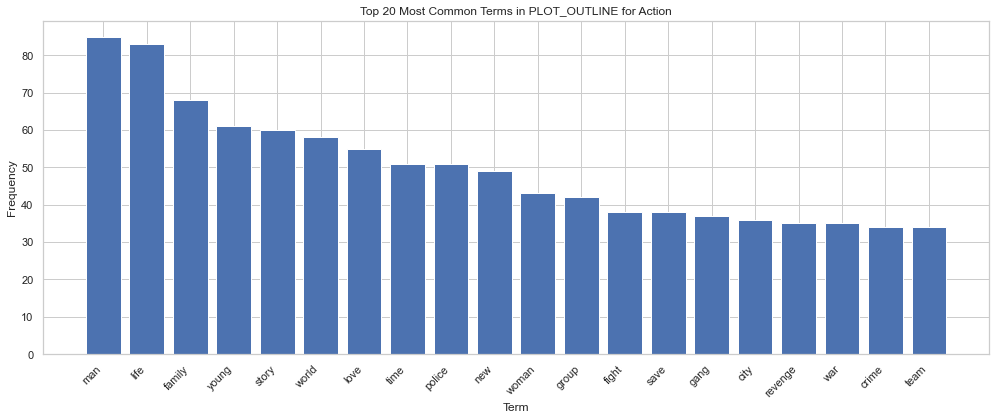

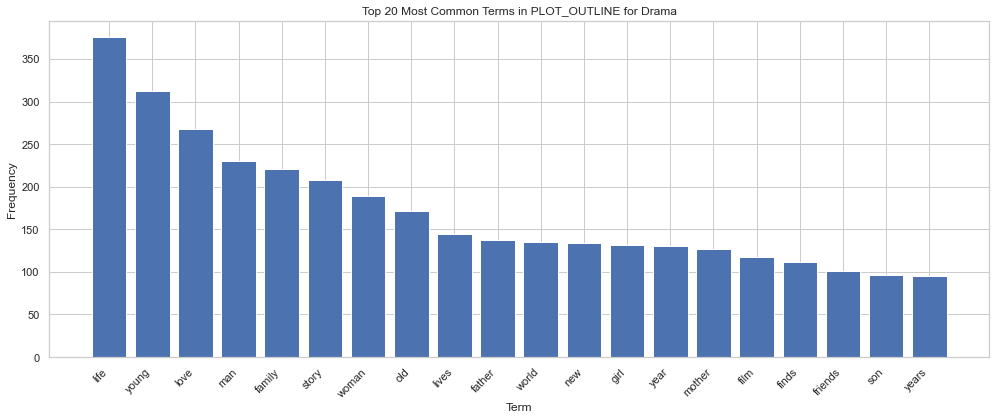

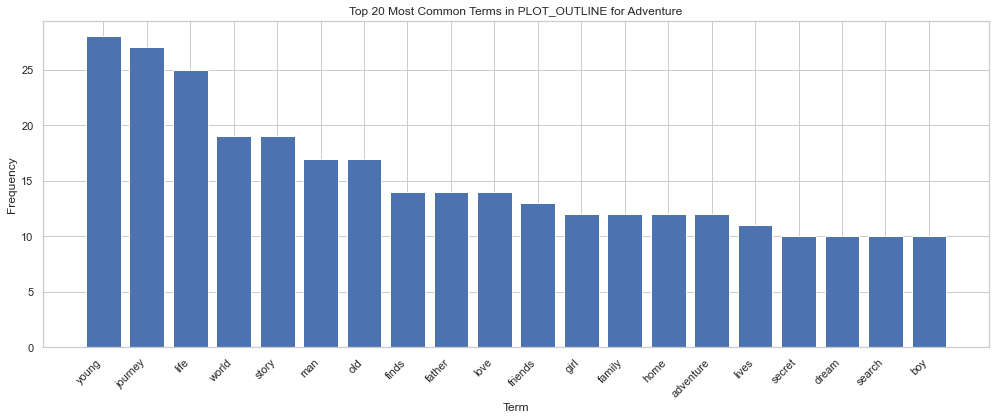

...

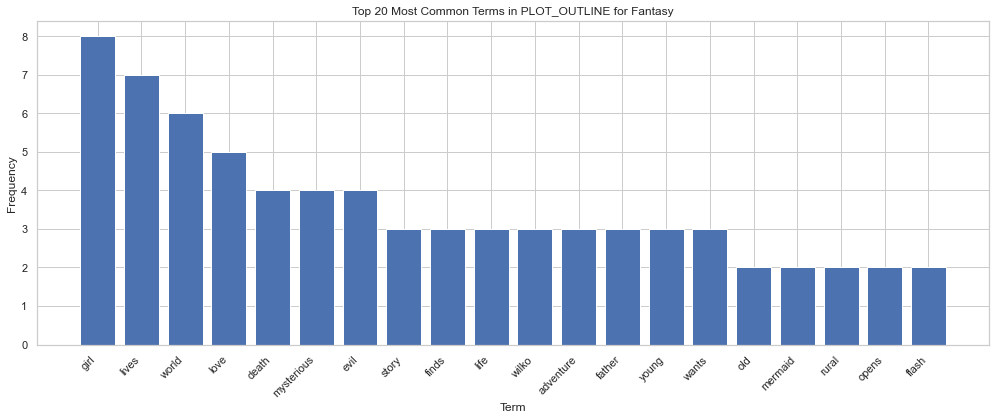

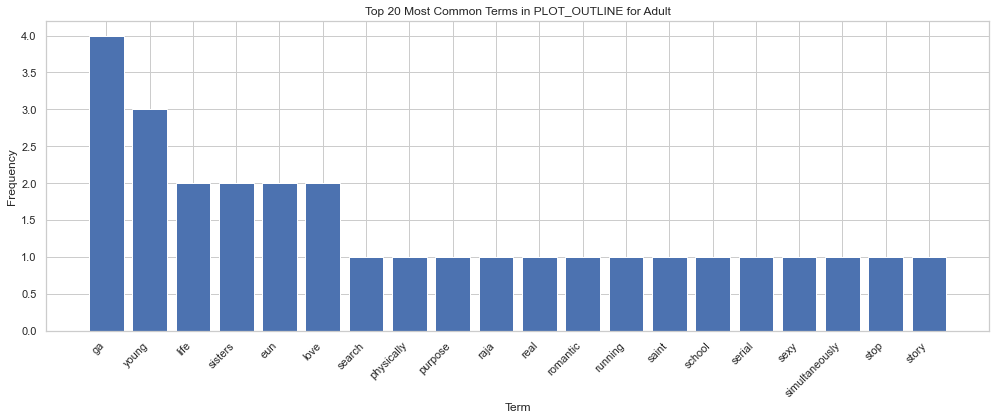

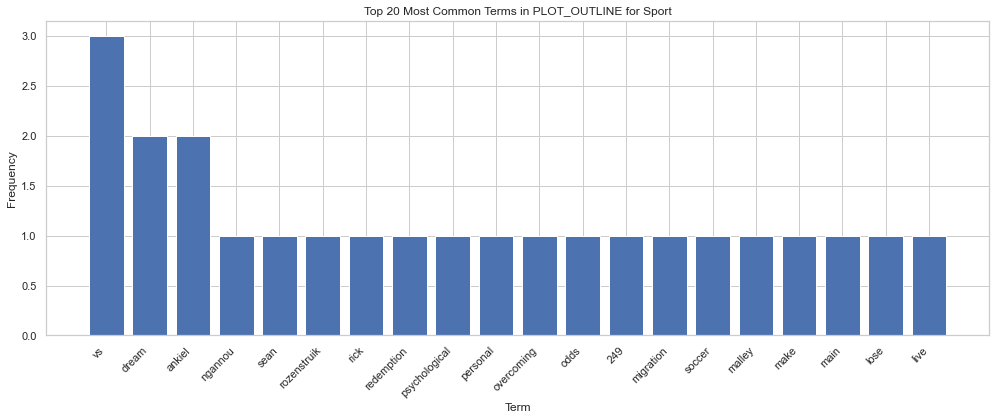

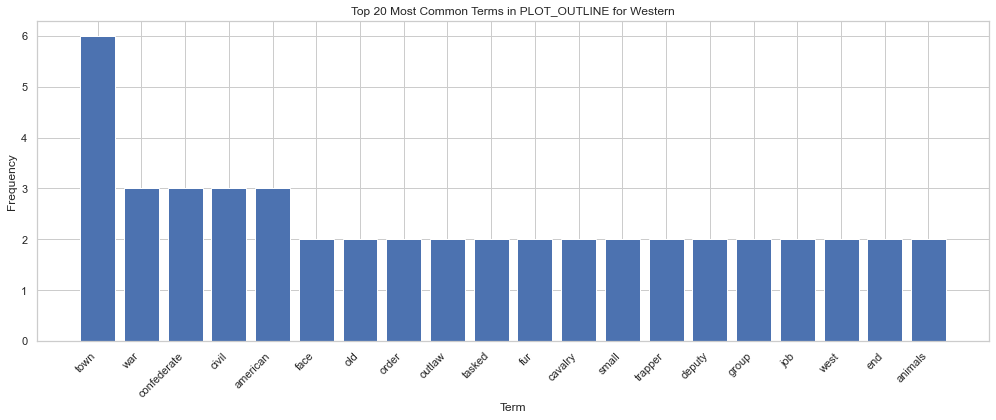

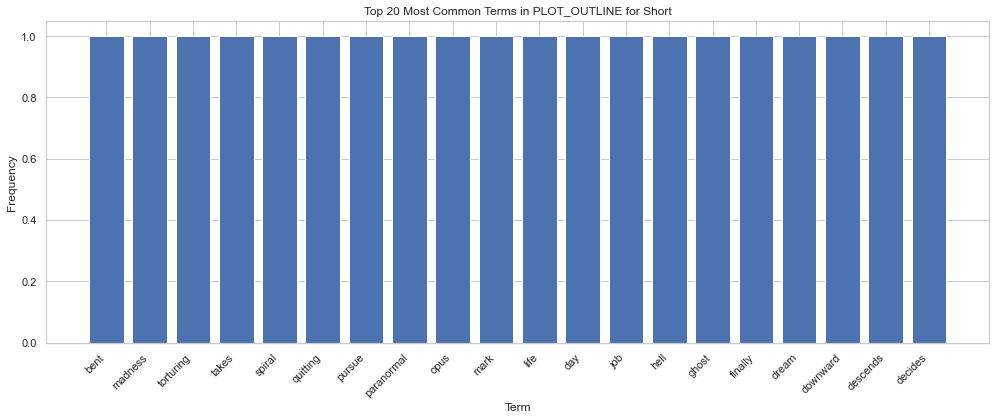

In [30]:
# Plot top terms for PLOT_OUTLINE by genre
for genre in df['SRC_GENRE'].unique():
    plot_top_terms_by_genre(df, genre, 'PLOT_OUTLINE', f'Top 20 Most Common Terms in PLOT_OUTLINE for {genre}')

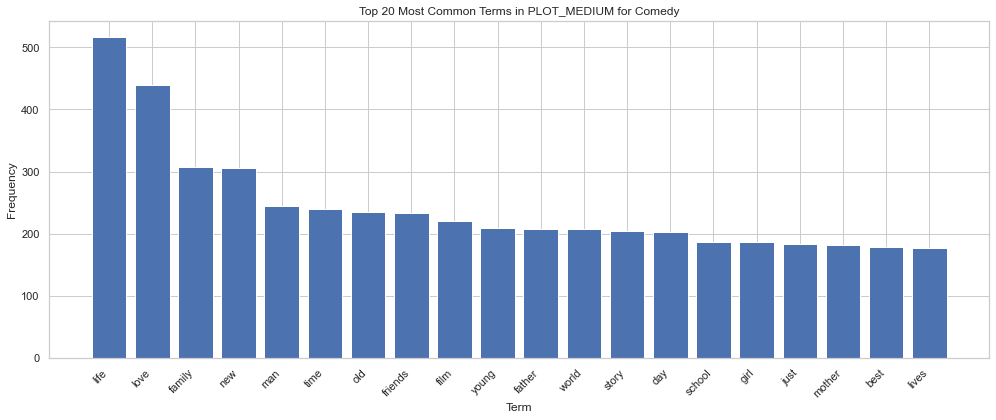

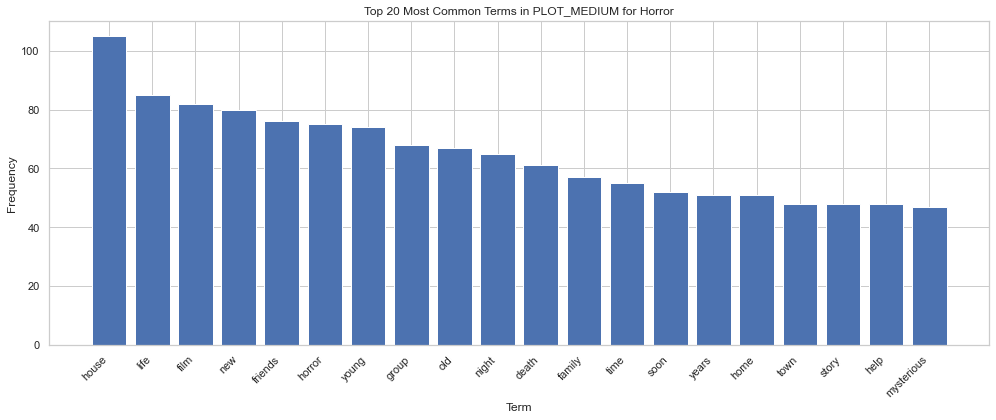

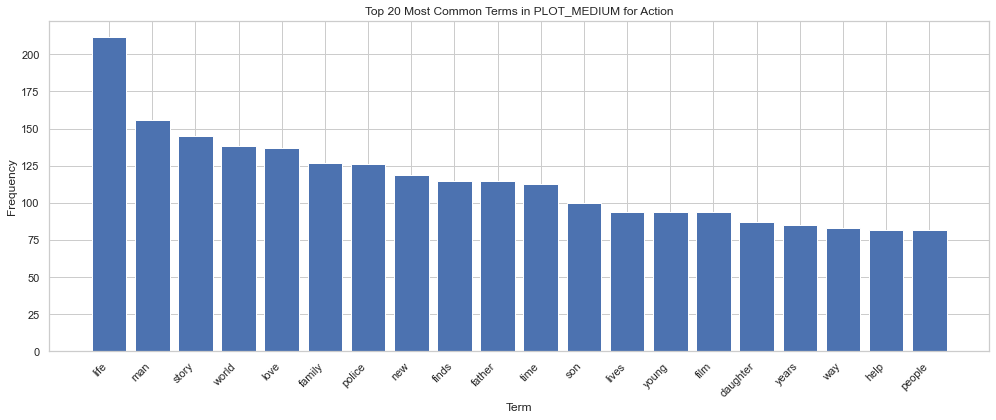

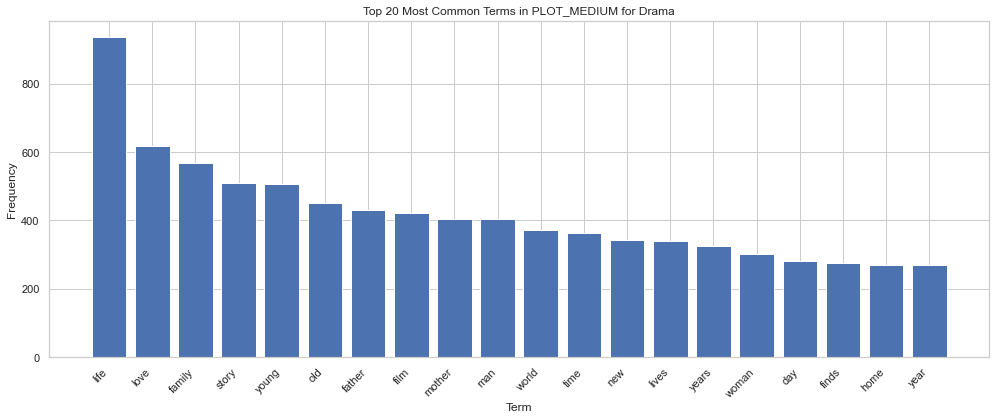

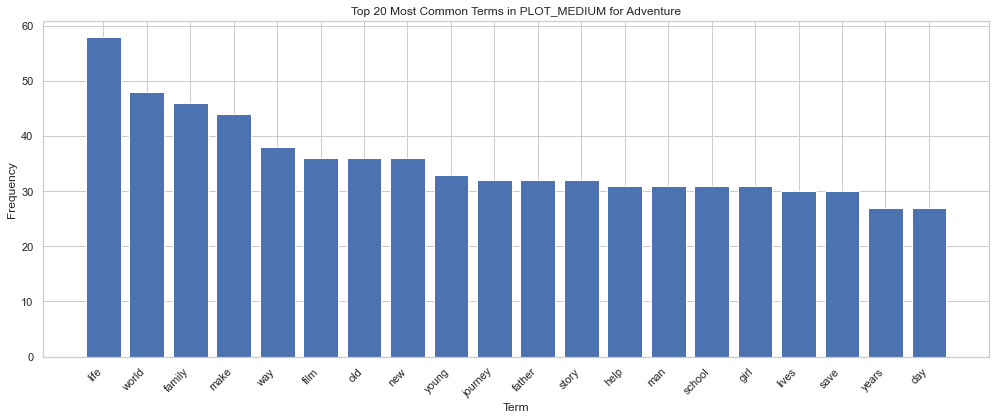

...

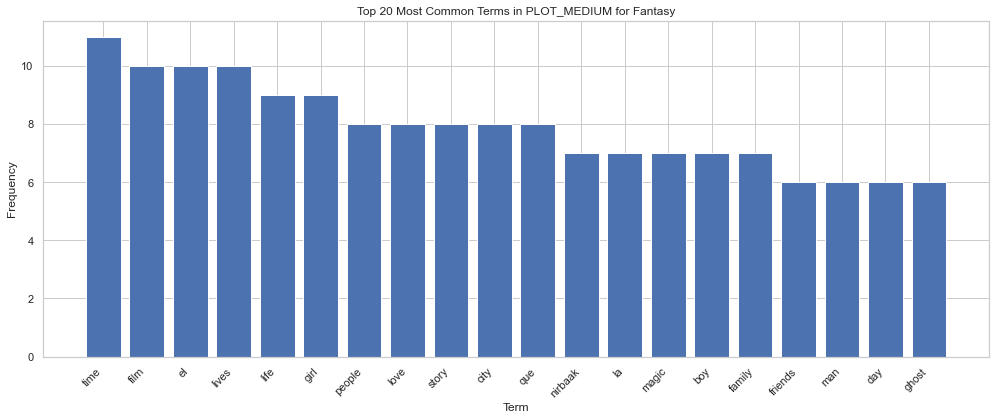

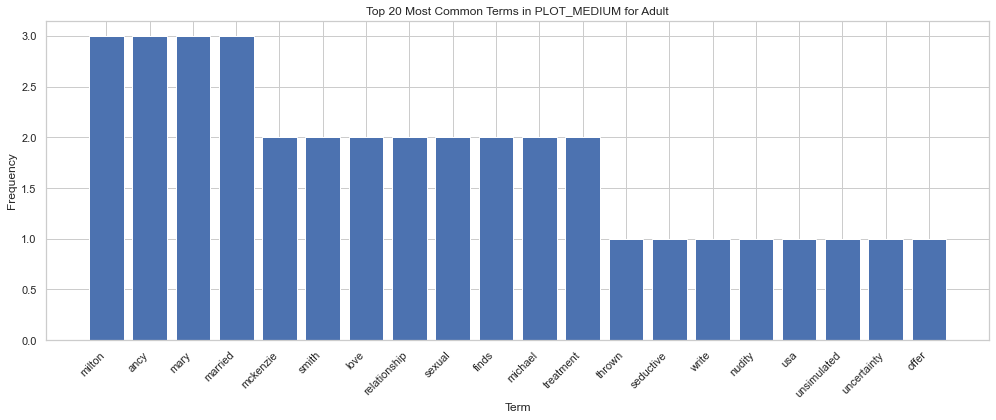

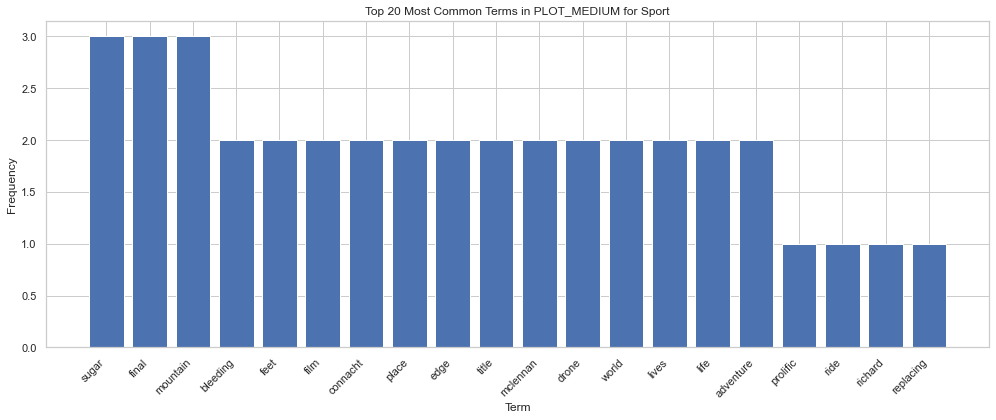

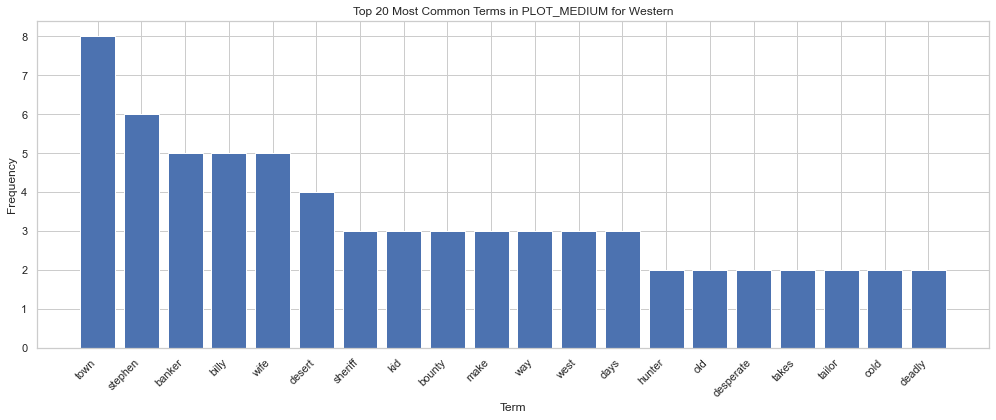

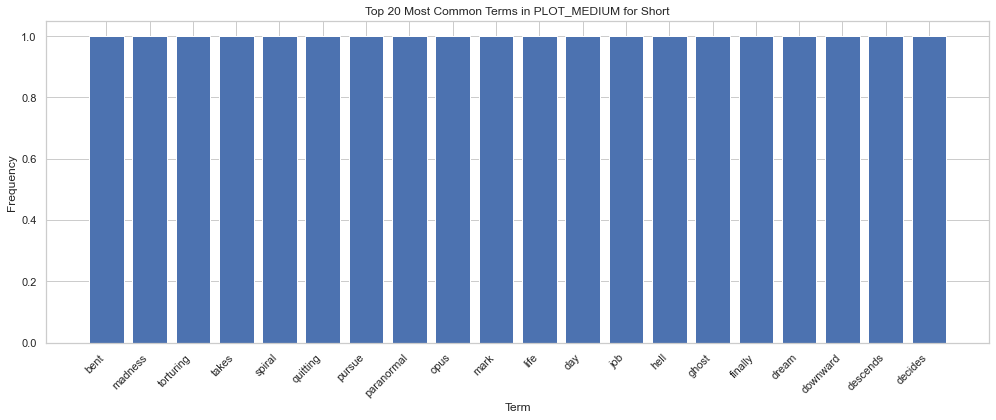

In [31]:
# Plot top terms for PLOT_MEDIUM by genre
for genre in df['SRC_GENRE'].unique():
    plot_top_terms_by_genre(df, genre, 'PLOT_MEDIUM', f'Top 20 Most Common Terms in PLOT_MEDIUM for {genre}')

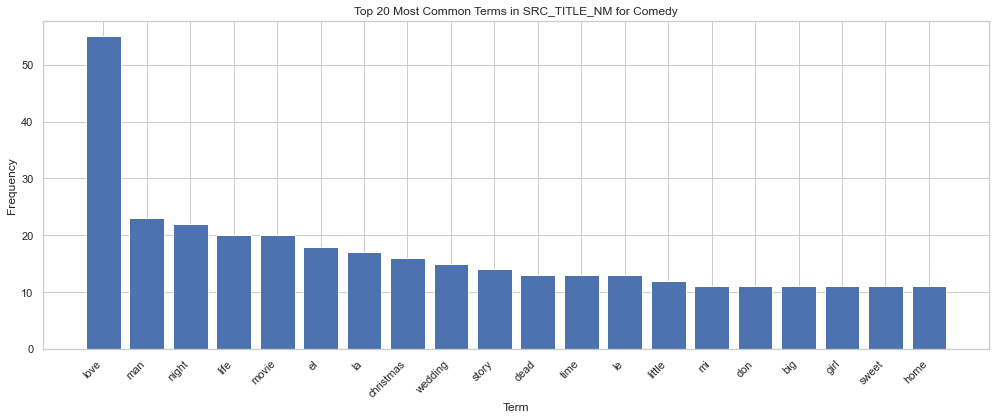

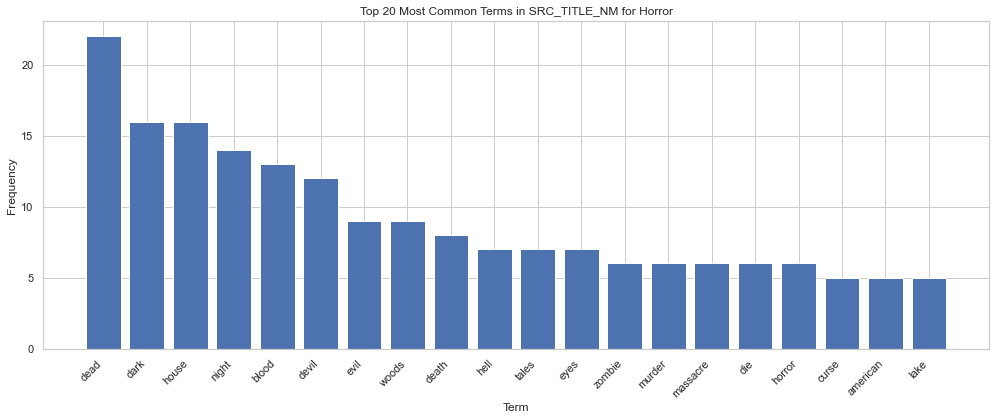

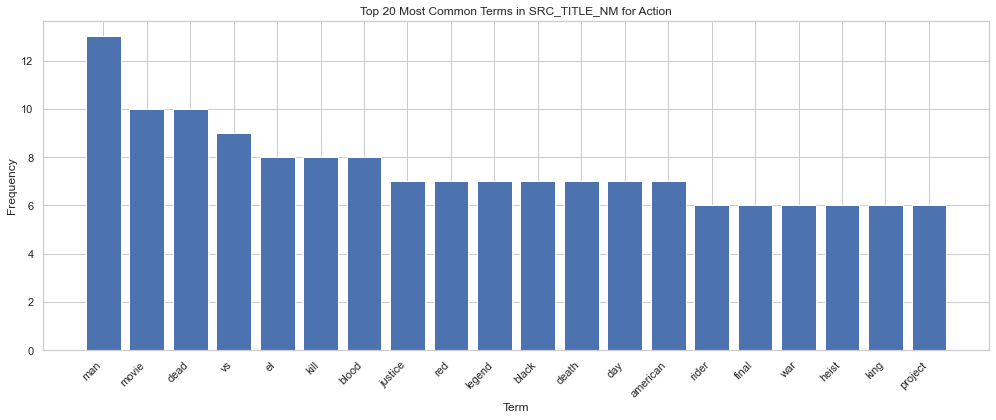

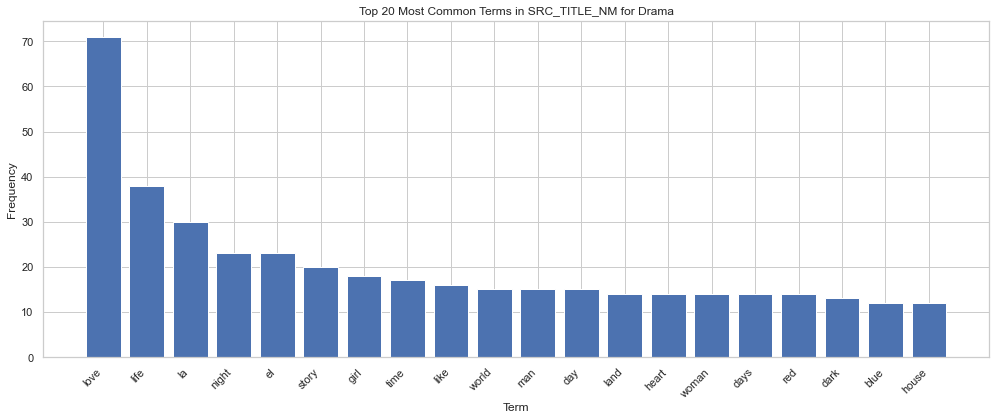

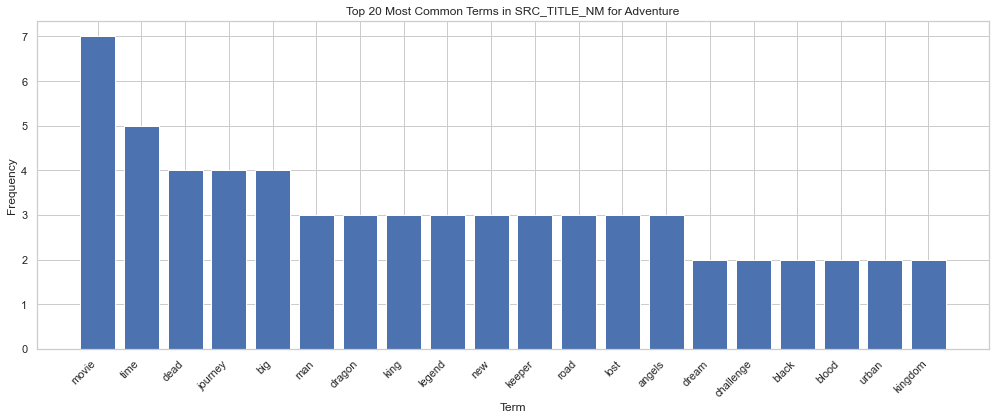

...

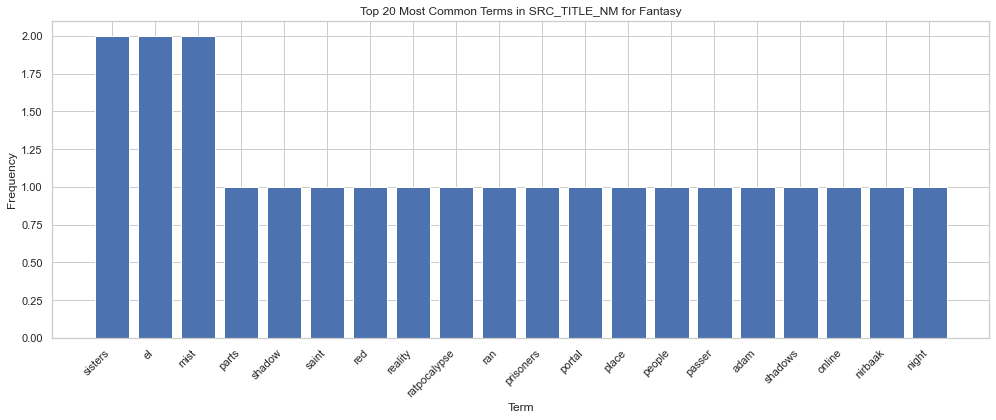

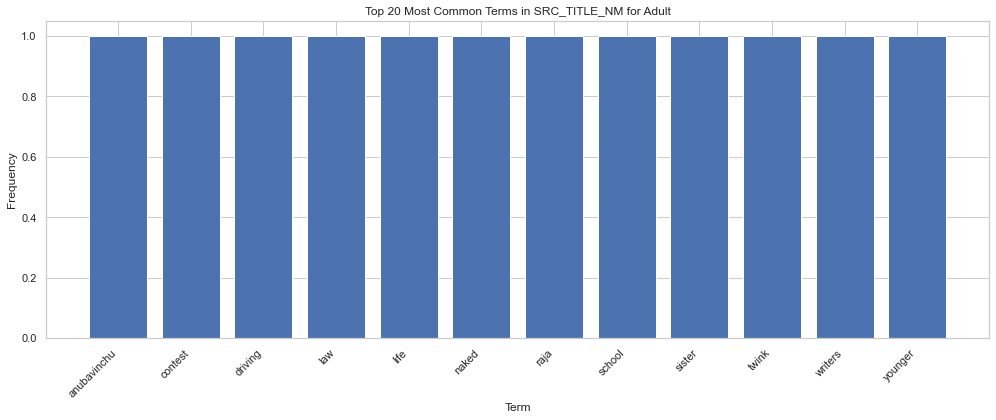

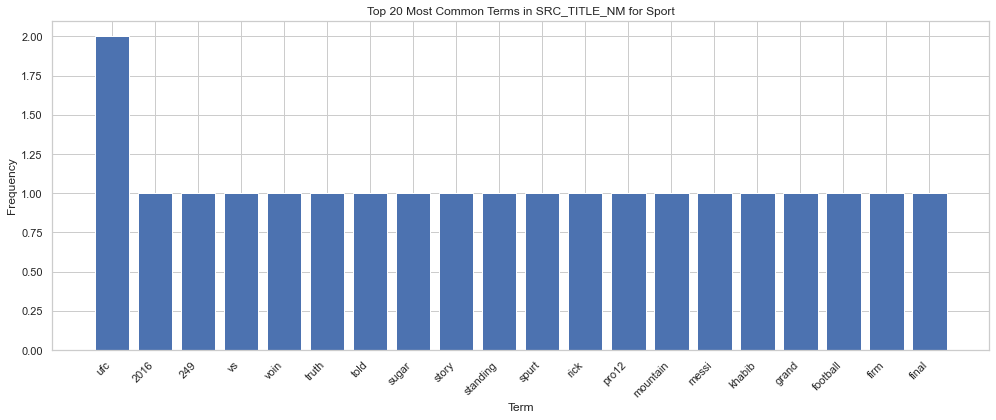

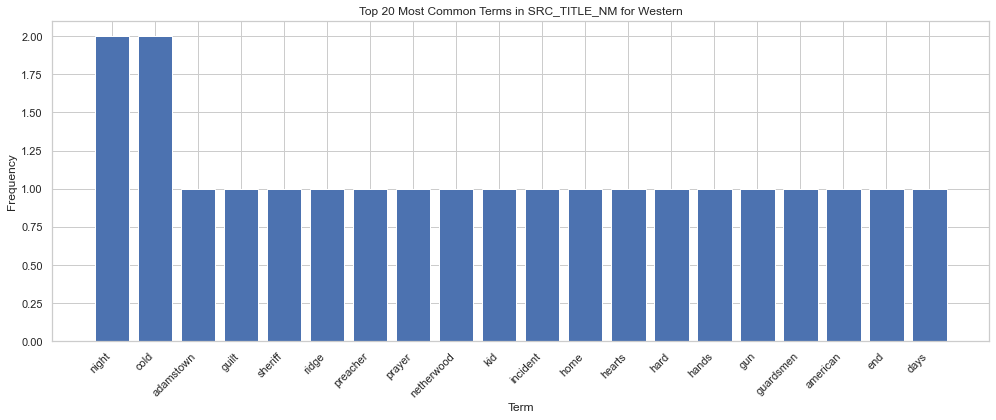

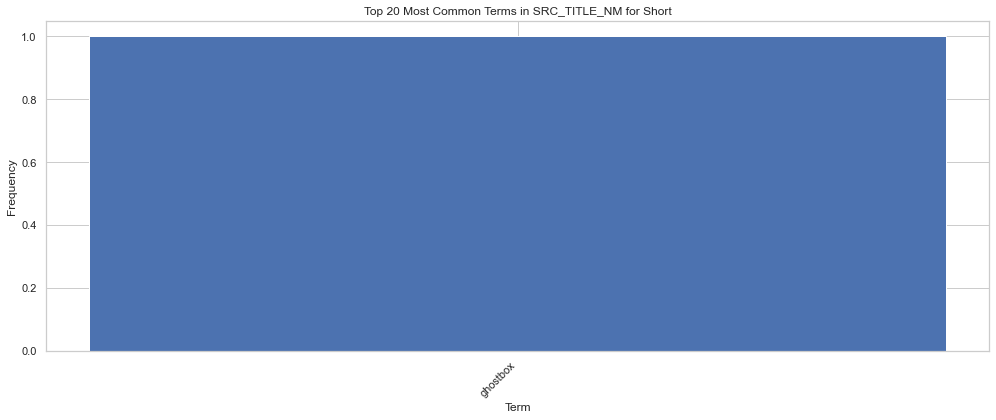

In [32]:
# Plot top terms for SRC_TITLE_NM by genre
for genre in df['SRC_GENRE'].unique():
    plot_top_terms_by_genre(df, genre, 'SRC_TITLE_NM', f'Top 20 Most Common Terms in SRC_TITLE_NM for {genre}')

As the analysis of the most frequent terms by genre proved interesting, we must calculate by film.

In [33]:
# Function to calculate the most common terms in a text
def calculate_top_terms(text_column, num_top_terms=20):
    # Replace NaN values with an empty string
    text_column = text_column.fillna('')
    
    # Text preprocessing (removing stopwords, punctuation, etc.) and tokenization
    vectorizer = CountVectorizer(stop_words='english')
    X = vectorizer.fit_transform(text_column.astype(str))  # Converting to string
    
    # Calculate word frequencies
    word_frequencies = X.sum(axis=0)

    # Get the most common terms
    terms = vectorizer.get_feature_names_out()
    word_freq_df = pd.DataFrame({'Term': terms, 'Frequency': word_frequencies.flat})
    word_freq_df = word_freq_df.sort_values(by='Frequency', ascending=False)
    
    # Return the most common terms
    return word_freq_df['Term'][:num_top_terms].tolist()

# Function to add columns of most common terms to a DataFrame
def add_top_terms_columns(df, text_columns, num_top_terms=20):
    for column in text_columns:
        # Calculate the most common terms for the column
        top_terms = calculate_top_terms(df[column], num_top_terms)
        
        # Add the most common terms as a new column in the DataFrame
        df[f'TOP_TERMS_{column}'] = df[column].apply(lambda text: [term for term in top_terms if isinstance(text, str) and term in text.split()])

In [34]:
# List of text columns to process
text_columns = ['PLOT_SUMMARY', 'PLOT_OUTLINE', 'PLOT_MEDIUM', 'SRC_TITLE_NM']

# Add columns of most common terms for each text column
add_top_terms_columns(df, text_columns)



These plots of terms by Genres can suggest that we have  patterns of most commom words by genre.

Going further, we need to check the simmilarities and differences of each most commom words.

### Most Commom terms similarities

In [35]:
import itertools
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import jaccard_score

def calculate_jaccard_similarity(df, column_name):
    # List of all unique genres in the dataset
    genres = df['SRC_GENRE'].unique()
    
    # Dictionary to store Jaccard similarities between genre pairs
    jaccard_similarities = {}

    # Use CountVectorizer to count the frequency of words in the specified column for all genres
    vectorizer = CountVectorizer(stop_words='english')
    X = vectorizer.fit_transform(df[column_name].astype(str))  # Convert to string explicitly

    # Calculate Jaccard similarity between all pairs of genres
    for genre1, genre2 in itertools.combinations(genres, 2):
        # Filter the DataFrame by the chosen genres
        genre1_df = df[df['SRC_GENRE'] == genre1]
        genre2_df = df[df['SRC_GENRE'] == genre2]

        # Index CountVectorizer data for chosen genres
        idx_genre1 = [i for i, g in enumerate(df['SRC_GENRE']) if g == genre1]
        idx_genre2 = [i for i, g in enumerate(df['SRC_GENRE']) if g == genre2]

        # Calculate word frequencies in the specified column of each genre
        X_genre1 = X[idx_genre1]
        X_genre2 = X[idx_genre2]

        # Calculate Jaccard similarity between the sets of most common terms for each genre
        jaccard_similarity = jaccard_score(X_genre1.toarray().sum(axis=0), X_genre2.toarray().sum(axis=0), average='macro')

        # Store Jaccard similarity in the dictionary
        jaccard_similarities[(genre1, genre2)] = jaccard_similarity

    return jaccard_similarities

In [36]:
jaccard_similarities = calculate_jaccard_similarity(df, 'PLOT_SUMMARY')

print('Similarity between the most common terms:')
# Display Jaccard similarities in descending order
sorted_similarities = sorted(jaccard_similarities.items(), key=lambda x: x[1], reverse=True)
for pair, similarity in sorted_similarities:
    genre1, genre2 = pair
    print(f" {genre1} x {genre2}: {round(similarity, 4)}")

Similarity between the most common terms:
 Sport x Short: 0.2494
 Adult x Sport: 0.212
 Adult x Short: 0.2025
 Sport x Western: 0.172
 Western x Short: 0.1666
 War x Sport: 0.1528
 Adult x Western: 0.1484
 War x Adult: 0.1483
 War x Short: 0.1417
 War x Western: 0.1317
 History x War: 0.1181
 Musical x Western: 0.1177
 Musical x War: 0.117
 Music x Sport: 0.117
 Music x Western: 0.1167
 History x Western: 0.1164
 History x Sport: 0.1146
 History x Musical: 0.114
 Musical x Sport: 0.114
 Mystery x Musical: 0.1135
 Music x Adult: 0.1118
 Musical x Adult: 0.1103
 History x Short: 0.1099
 History x Adult: 0.1098
 Musical x Short: 0.1095
 Music x Short: 0.1095
 Music x Musical: 0.1079
 Mystery x Fantasy: 0.1075
 History x Mystery: 0.1063
 Music x War: 0.1058
 History x Music: 0.1038
 Music x Mystery: 0.1036
 Mystery x War: 0.103
 Mystery x Western: 0.1026
 Mystery x Sport: 0.1015
 Sci-Fi x Fantasy: 0.099
 Mystery x Adult: 0.0979
 Mystery x Short: 0.097
 Sci-Fi x Western: 0.0964
 War x Sci-F

In [37]:
jaccard_similarities = calculate_jaccard_similarity(df, 'SRC_TITLE_NM')

print('Similarity between the most common terms:')
# Display Jaccard similarities in descending order
sorted_similarities = sorted(jaccard_similarities.items(), key=lambda x: x[1], reverse=True)
for pair, similarity in sorted_similarities:
    genre1, genre2 = pair
    print(f" {genre1} x {genre2}: {round(similarity, 4)}")

Similarity between the most common terms:
 Adult x Short: 0.4995
 War x Short: 0.4994
 War x Adult: 0.499
 War x Western: 0.3403
 War x Fantasy: 0.3354
 Sci-Fi x Western: 0.3345
 Sci-Fi x Adult: 0.3328
 Sport x Short: 0.3327
 Western x Short: 0.3325
 Adult x Sport: 0.3324
 War x Sport: 0.3323
 History x Short: 0.3323
 Adult x Western: 0.3322
 Sci-Fi x Fantasy: 0.332
 History x Adult: 0.332
 History x War: 0.332
 Fantasy x Western: 0.3319
 Sport x Western: 0.3319
 Sci-Fi x Short: 0.3303
 Fantasy x Short: 0.3302
 War x Sci-Fi: 0.33
 Fantasy x Adult: 0.3299
 Sci-Fi x Sport: 0.3297
 Fantasy x Sport: 0.3296
 Biography x Fantasy: 0.2564
 Mystery x Musical: 0.2524
 Music x Sport: 0.2519
 History x Mystery: 0.2516
 Musical x Western: 0.2513
 Musical x Fantasy: 0.2513
 Mystery x War: 0.251
 Mystery x Sci-Fi: 0.251
 History x Fantasy: 0.2504
 Music x Fantasy: 0.2495
 Music x Western: 0.2495
 Musical x Short: 0.2488
 History x Sport: 0.2487
 Mystery x Sport: 0.2487
 Musical x Adult: 0.2486
 Histo

Analyzing Jaccard's values, we observed that despite the similarities between some film genres, we were able to differentiate the patterns of most recurrent terms in the plot summary of each genre.

Therefore, this can be an essential feature for the modeling phase.


### Sentiment Analysis

Sentiment analysis of the plot summary, plot medium and plot outline columns can be very important for understanding sentiment patterns by genre.

In [38]:
def analyze_sentiment(df, column_name):
    # Initialize the sentiment analyzer
    sia = SentimentIntensityAnalyzer()

    # Function to assign a sentiment label based on the sentiment compound score
    def sentiment_label(score):
        if score >= 0.05:
            return 'Positive'
        elif score <= -0.05:
            return 'Negative'
        else:
            return 'Neutral'

    # Calculate sentiment for each entry in the specified column
    sentiments = []
    for text in df[column_name]:
        # Calculate sentiment score
        sentiment_score = sia.polarity_scores(str(text))['compound']
        # Assign a sentiment label
        label = sentiment_label(sentiment_score)
        sentiments.append(label)

    # Add sentiment labels to the DataFrame
    df[column_name + '_SENTIMENT'] = sentiments

    # Display sentiment label counts by genre
    sentiments_by_genre = df.groupby(['SRC_GENRE', column_name + '_SENTIMENT']).size().unstack(fill_value=0)

    # Plot the count of positive, negative, and neutral sentiments by genre
    sentiments_by_genre.plot(kind='bar', stacked=True, figsize=(16, 8))
    plt.title(column_name +' Sentiment Count by Genre')
    plt.xlabel('Genre')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Sentiment')
    plt.show()


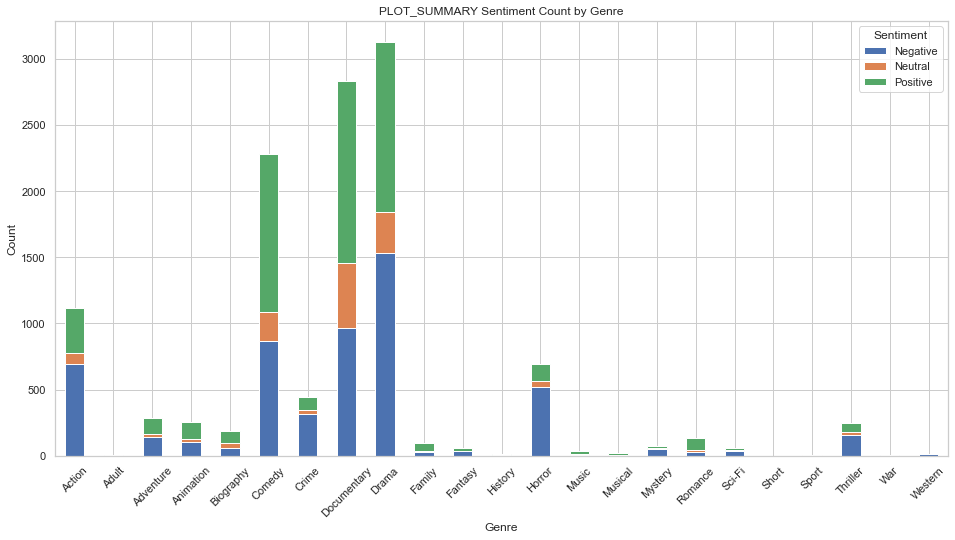

In [39]:
analyze_sentiment(df, 'PLOT_SUMMARY')

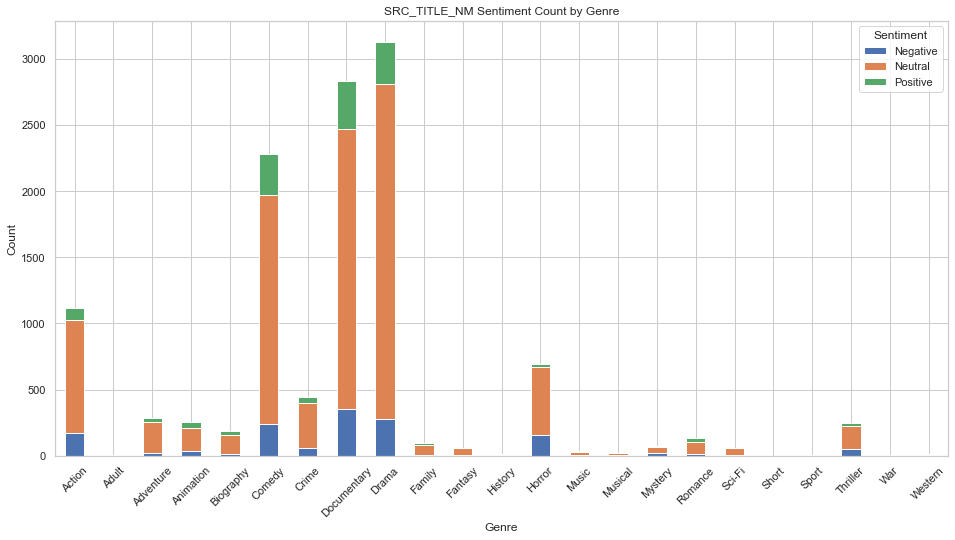

In [40]:
analyze_sentiment(df, 'SRC_TITLE_NM')

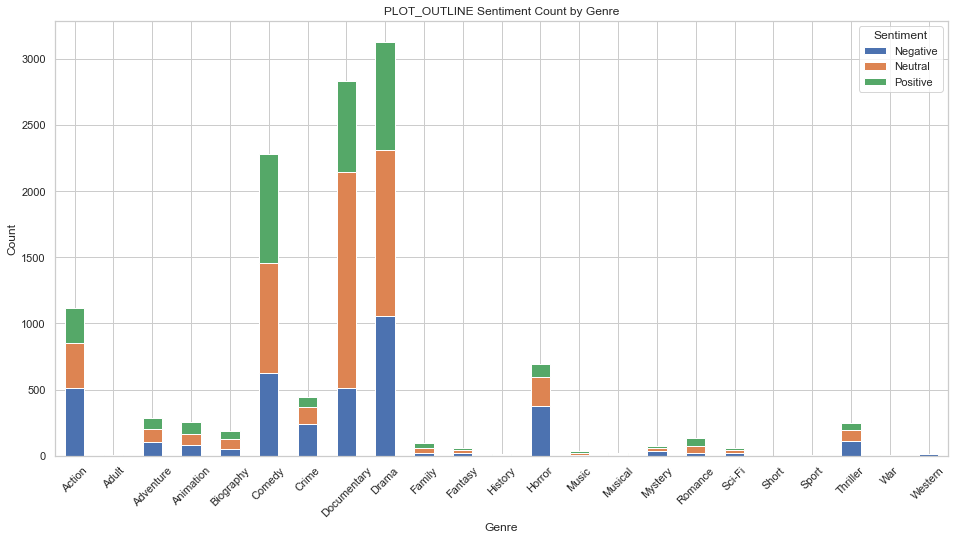

In [41]:
analyze_sentiment(df, 'PLOT_OUTLINE')

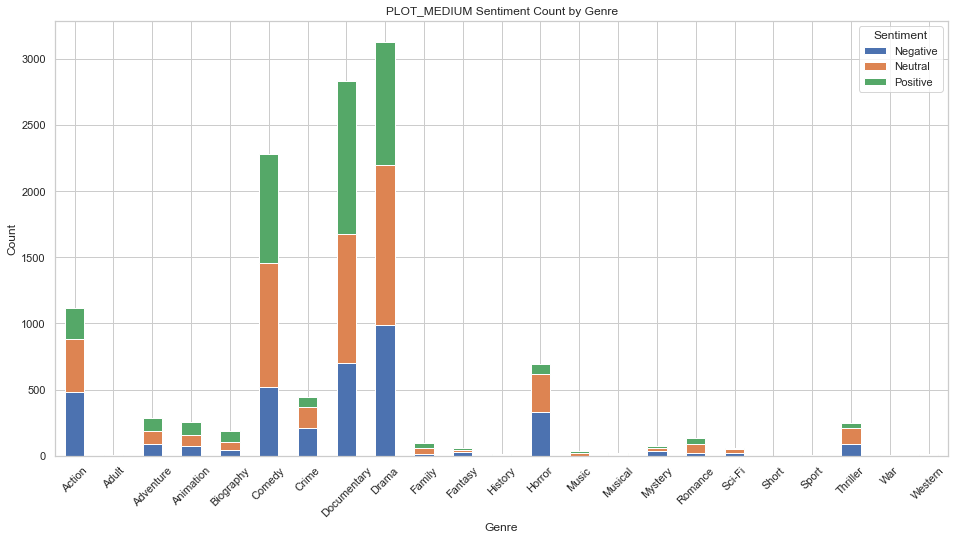

In [42]:
analyze_sentiment(df, 'PLOT_MEDIUM')

The proportion between positive and negative feelings in each gender shows us how they are correlated with their gender. As an example, we can compare the proportion of positives and negatives for the horror and comedy genres.

### Entity Analysis and Dominant Topic

Analyzing relevant entities and topics helps distinguish movie genres. Important entities reveal the themes and contexts, while dominant topics highlight the narrative elements characteristic of each genre.

In [43]:
# Load pre-trained English language model
nlp = spacy.load('en_core_web_sm')

# Function to extract entities from text
def extract_entities(text):
    if pd.isnull(text):  # Check if the text is NaN
        return []  # Return an empty list if NaN
    doc = nlp(text)
    entities = [ent.text for ent in doc.ents if ent.label_ in ['PERSON', 'ORG', 'LOC']]
    return entities

# Apply the function to movie plots after replacing NaN values with empty strings
df['ENTITIES'] = df['PLOT_SUMMARY'].fillna('').apply(extract_entities)

In [44]:
# Convertendo os valores da coluna para string
plot_texts = df['PLOT_SUMMARY'].astype(str).tolist()
plot_tokens = [text.split() for text in plot_texts]
dictionary = Dictionary(plot_tokens)

# Filtrar tokens extremos no dicionário (opcional)
dictionary.filter_extremes(no_below=5, no_above=0.5)

# Criar um corpus a partir dos enredos dos filmes
corpus = [dictionary.doc2bow(tokens) for tokens in plot_tokens]

# Treinar o modelo LDA
lda_model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=10, passes=10)

In [45]:
# Função para obter o tópico dominante de um enredo de filme
def get_dominant_topic(lda_model, text):
    # Convertendo o texto em um formato de bag-of-words
    bow = dictionary.doc2bow(text.split())
    
    # Obtendo a distribuição de tópicos para o documento
    topic_distribution = lda_model.get_document_topics(bow)
    
    # Retornando o tópico com a maior pontuação
    dominant_topic = max(topic_distribution, key=lambda x: x[1])[0]
    
    return dominant_topic

# Adicionando uma nova coluna 'DOMINANT_TOPIC' ao DataFrame
df['DOMINANT_TOPIC'] = [get_dominant_topic(lda_model, text) for text in plot_texts]

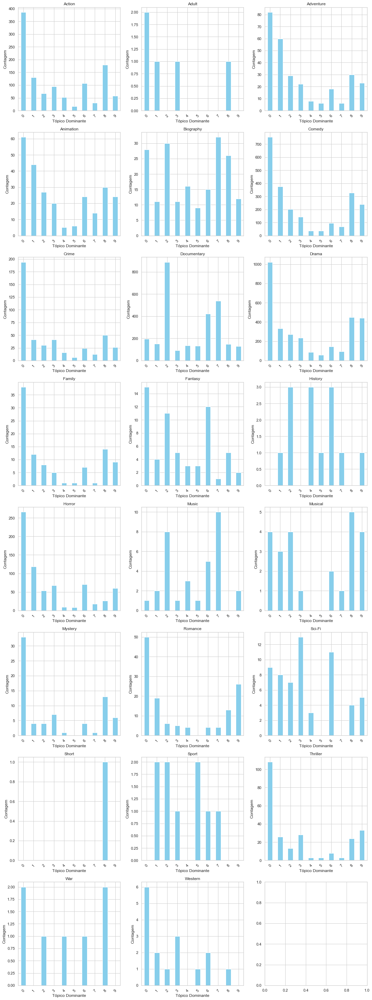

In [46]:
# Agrupar os dados por gênero e tópico dominante e contar ocorrências
topic_counts_by_genre = df.groupby(['SRC_GENRE', 'DOMINANT_TOPIC']).size().unstack(fill_value=0)


# Verificar o número total de gêneros
total_genres = len(topic_counts_by_genre)

# Calcular o número de linhas e colunas dos subplots
num_rows = total_genres // 3 + (1 if total_genres % 3 != 0 else 0)
num_cols = min(total_genres, 3)

# Plotar a contagem de tópicos dominantes por gênero
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 5*num_rows))

for i, (genre, topic_counts) in enumerate(topic_counts_by_genre.iterrows()):
    ax = axes[i//3, i%3] if num_rows > 1 else axes[i%3]
    topic_counts.plot(kind='bar', ax=ax, color='skyblue')
    ax.set_title(genre)
    ax.set_xlabel('Tópico Dominante')
    ax.set_ylabel('Contagem')
    ax.set_xticklabels(topic_counts.index, rotation=45)

plt.tight_layout()
plt.show()

By finding the main topics we can see that genres have different relevant topics in the summary, that is, this can tell us that this is an interesting thing to understand how the topics in the summary relate to the genre.

## 5. Correlation Analysis

In this part we will analyze the correlation of natural and artificial features with our Target column, in this case, Gender.

For categoricalXcategorical column relationships, we will use cramer.

In [47]:
def calculate_cramer_v(df, column1, column2):
    # Calculate the contingency table between the categorical variables
    contingency_table = pd.crosstab(df[column1], df[column2])

    # Calculate Cramer's V correlation coefficient
    cramer_v = ss.chi2_contingency(contingency_table)[0] / len(df)
    
    return cramer_v

In [48]:
cramer_v_sentiment = calculate_cramer_v(df, 'SRC_GENRE', 'PLOT_SUMMARY_SENTIMENT')
print(cramer_v_sentiment)

cramer_v_tittlesentiment = calculate_cramer_v(df, 'SRC_GENRE', 'SRC_TITLE_NM_SENTIMENT')
print(cramer_v_tittlesentiment)

cramer_v_outlinesentiment = calculate_cramer_v(df, 'SRC_GENRE', 'PLOT_OUTLINE_SENTIMENT')
print(cramer_v_outlinesentiment)

cramer_v_mediumsentiment = calculate_cramer_v(df, 'SRC_GENRE', 'PLOT_MEDIUM_SENTIMENT')
print(cramer_v_mediumsentiment)

cramer_v_topic = calculate_cramer_v(df, 'SRC_GENRE', 'DOMINANT_TOPIC')
print(cramer_v_topic)

#Taking rating as categorical, but we will test different also.(this test could be a wrong interpretation)
cramer_v_rating = calculate_cramer_v(df, 'SRC_GENRE', 'RATING_AVG')
print(cramer_v_rating)



0.07842493015132948
0.021341309770443524
0.07942353408091793
0.054699796274758655
0.30555553120105694
0.5507934482889567


In [49]:
#Another approach, taking rating as continuous

statistic, p_value = kruskal(*[df[df['SRC_GENRE'] == genre]['RATING_AVG'] for genre in df['SRC_GENRE'].unique()])

print(f"Estatística do teste de Kruskal-Wallis: {statistic}")
print(f"Valor-p do teste de Kruskal-Wallis: {p_value}")

Estatística do teste de Kruskal-Wallis: 2718.450517362323
Valor-p do teste de Kruskal-Wallis: 0.0


In [50]:
statistic, p_value = kruskal(*[df[df['SRC_GENRE'] == genre]['BUDGET_AMT'].fillna(df['BUDGET_AMT'].median()) for genre in df['SRC_GENRE'].unique()])

print(f"Estatística do teste de Kruskal-Wallis: {statistic}")
print(f"Valor-p do teste de Kruskal-Wallis: {p_value}")

Estatística do teste de Kruskal-Wallis: 299.00972387603935
Valor-p do teste de Kruskal-Wallis: 1.9386517196679114e-50


In [51]:
statistic, p_value = kruskal(*[df[df['SRC_GENRE'] == genre]['NO_OF_VOTES'].fillna(df['BUDGET_AMT'].median()) for genre in df['SRC_GENRE'].unique()])

print(f"Estatística do teste de Kruskal-Wallis: {statistic}")
print(f"Valor-p do teste de Kruskal-Wallis: {p_value}")

Estatística do teste de Kruskal-Wallis: 1319.1785390976142
Valor-p do teste de Kruskal-Wallis: 1.5262201272349343e-265


In [52]:
statistic, p_value = kruskal(*[df[df['SRC_GENRE'] == genre]['RUN_TIME'].fillna(df['BUDGET_AMT'].median()) for genre in df['SRC_GENRE'].unique()])

print(f"Estatística do teste de Kruskal-Wallis: {statistic}")
print(f"Valor-p do teste de Kruskal-Wallis: {p_value}")

Estatística do teste de Kruskal-Wallis: 1594.2931900235073
Valor-p do teste de Kruskal-Wallis: 0.0


The result of the Kruskal-Wallis test indicates that there are statistically significant differences in the average ratings between different film genres. This suggests that the genre of films has a significant impact on the average ratings they receive. In other words, different genres tend to have different average rating levels.


#### Mapp catagorical to numerical

In [53]:
def encode_categorical_columns(df, categorical_columns):
    
    encoder = OrdinalEncoder()
    encoder.fit(df[categorical_columns])
    encoded_data = encoder.transform(df[categorical_columns])
    
    
    for i, column in enumerate(categorical_columns):
        new_column_name = f"{column}_ENCODED"
        df[new_column_name] = encoded_data[:, i]
    
    return df



In [54]:
categorical_columns = ['SRC_GENRE', 'PLOT_SUMMARY_SENTIMENT','SRC_TITLE_NM_SENTIMENT','PLOT_OUTLINE_SENTIMENT','PLOT_MEDIUM_SENTIMENT']

df = encode_categorical_columns(df, categorical_columns)

In [55]:
def plot_spearman_correlation(df):
    
    spearman_corr = df.corr(method='spearman')
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(spearman_corr, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
    plt.title('Spearman Correlation Matrix')
    plt.show()

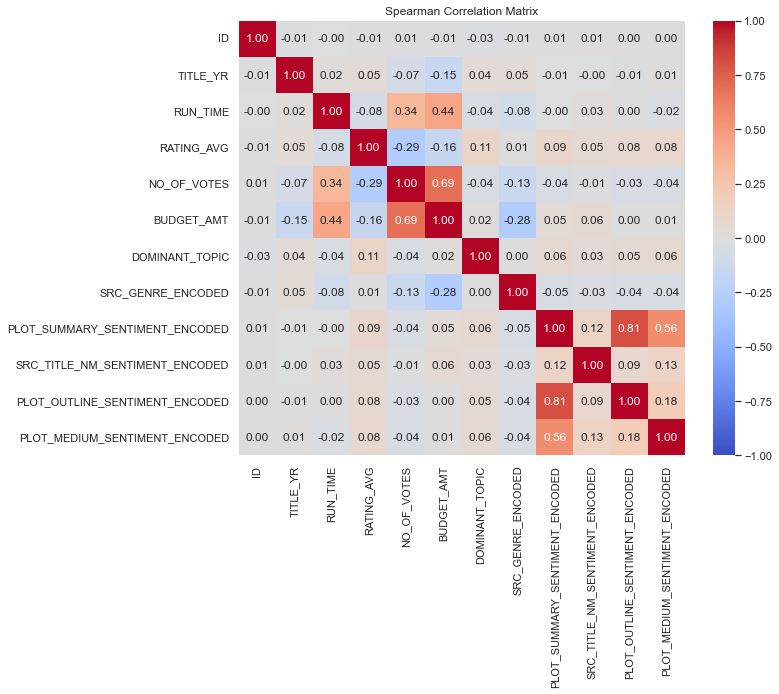

In [56]:
plot_spearman_correlation(df)

* Now analyzing the Spearman correlation matrix, we can see that although we do not have high correlation values ​​with the gender column, they cannot be considered too low to not be relevant in a possible predictive modeling of gender. Another thing that draws attention are the high correlation values between other features. *

## Conclusion and Findings

After completing the exploratory data analysis (EDA), several insights were obtained from the dataset:

1. **Data Quality Issues:**
   - Some columns exhibit significant data quality issues due to missing data.
   - The imbalance in the number of films per genre could pose challenges for predictive modeling tasks.


2. **Budget Disparity Among Genres:**
   - The average budget varies widely across different genres, indicating disparities in financial investment.
   - High standard deviations suggest the presence of outliers, possibly reflecting films with unexpectedly high budgets relative to their genres.


3. **Rating Consistency Across Genres:**
   - Ratings of films across genres show relatively consistent evaluations.
   - However, high standard deviations suggest the presence of outliers in ratings for certain genres.
   - Temporal analysis did not reveal a clear trend of rating improvement over time for specific genres, although a period of increased popularity during the COVID-19 pandemic was noted.


4. **Textual Analysis:**
   - Identifying frequent terms revealed genre-specific patterns, such as the prevalence of "death" in horror films and "love" in romance films.
   - Jaccard similarity analysis highlighted similarities and differences in recurrent word patterns among genres, essential for predictive analyses.


5. **Sentiment Analysis:**
   - Extracting sentiment from textual columns revealed interesting proportions of positive and negative sentiments aligned with genre expectations.
   - Utilizing sentiment analysis could enhance predictive modeling and provide insights into narrative and title patterns.


6. **Topic Modeling:**
   - Analysis of dominant topics (through entity extraction) revealed distinct patterns associated with each film genre.


7. **Correlation Analysis:**
   - Cramer's V tests for categorical variables and genre showed moderate associations.
   - Significant statistical variance was observed between budget, rating, number of votes, runtime, and genre.
   - Correlation analysis suggests the potential for building predictive models of genre using these variables as features.


**Final Remarks:**
   - Despite challenges in data quality and genre imbalance, the EDA provided valuable insights into film characteristics and audience preferences.
   - Further investigations, such as deepening temporal analyses and refining feature engineering for predictive models, could lead to enhanced understanding and predictive accuracy in the film industry.


### Bônus

Just for fun and curiosity we built a wordcloud of each Genre of movies.

In [57]:
def generate_wordcloud_by_genre(df, genre):
    # Filtrar o dataframe para o gênero específico
    genre_df = df[df['SRC_GENRE'].apply(lambda x: genre in x)]

    # Concatenar os textos das colunas "PLOT_OUTLINE", "PLOT_MEDIUM" e "PLOT_SUMMARY" para o gênero específico
    all_text = " ".join(genre_df['SRC_TITLE_NM'].fillna('').astype(str)+''+genre_df['PLOT_OUTLINE'].fillna('').astype(str) + " " + genre_df['PLOT_MEDIUM'].fillna('').astype(str) + " " + genre_df['PLOT_SUMMARY'].fillna('').astype(str))

    # Tokenização e remoção de stopwords
    tokens = word_tokenize(all_text)
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word.lower() for word in tokens if word.isalpha() and word.lower() not in stop_words]

    # Análise de palavras frequentes
    freq_dist = FreqDist(filtered_tokens)
    top_words = freq_dist.most_common(20)
#     print(f"Palavras mais frequentes para o gênero '{genre}':")
#     for word, frequency in top_words:
#         print(f"{word}: {frequency}")

    # Visualização das palavras mais frequentes
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud das Palavras Mais Frequentes para o Gênero {genre}')
    plt.show()


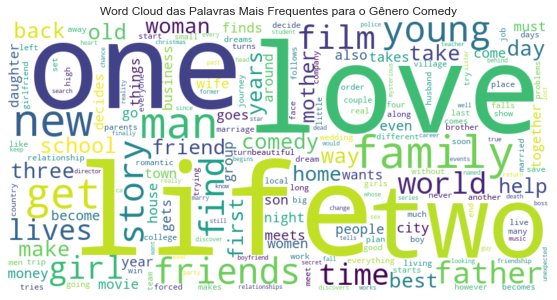

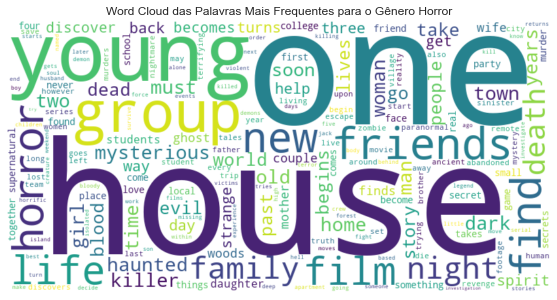

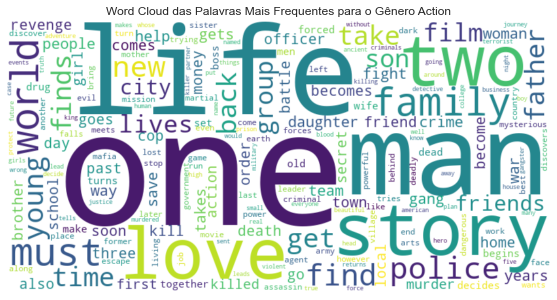

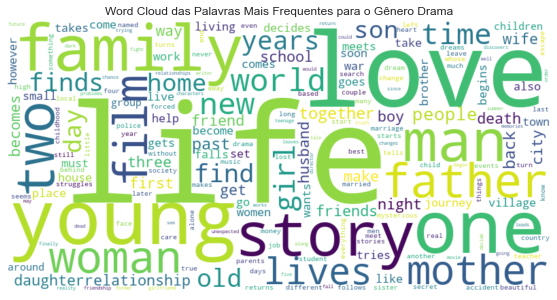

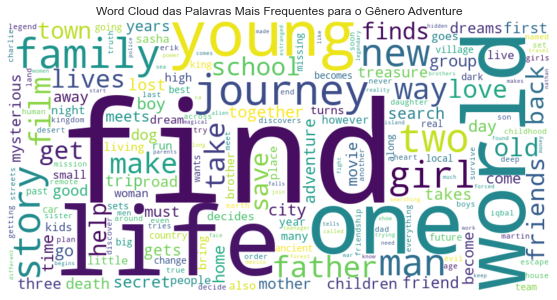

...

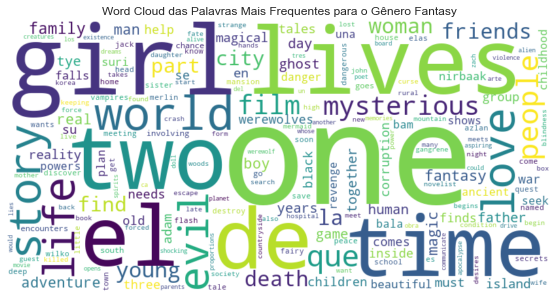

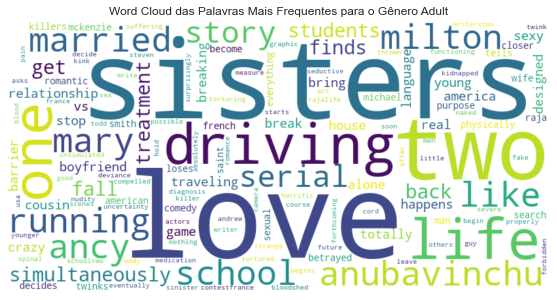

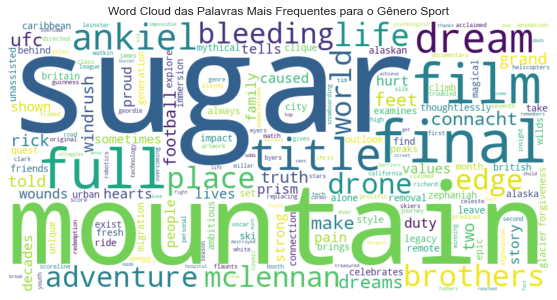

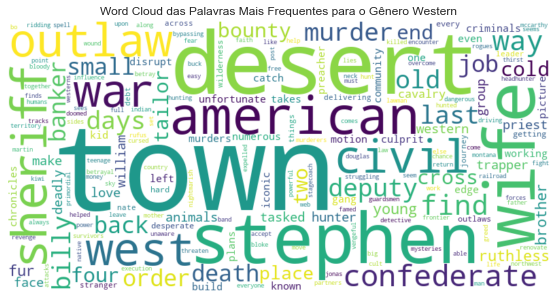

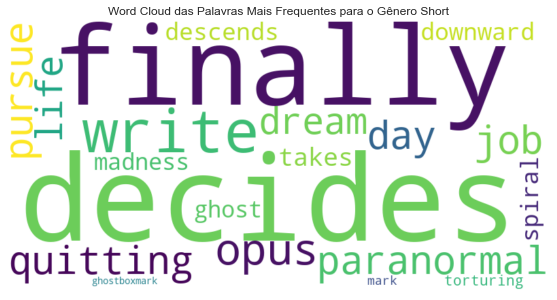

In [58]:
unique_genres = df['SRC_GENRE'].explode().unique()

for genre in unique_genres:
    generate_wordcloud_by_genre(df, genre)